# Images

In [56]:
import cv2
from matplotlib import pyplot as plt
import numpy as np
import imutils 

def display_image(image, title="Image Viewer"):
    """
    Display an image in a Jupyter Notebook with a given title.

    Args:
        image (numpy.ndarray): Image array loaded using OpenCV or another library.
        title (str): Title for the displayed image.
    """
    
    # Display the image using Matplotlib
    plt.figure(figsize=(6, 6))
    plt.imshow(image)
    plt.title(title)  # Add the specified title
    plt.axis("on")   # Hide or shor axis values
    plt.show()

## Display image

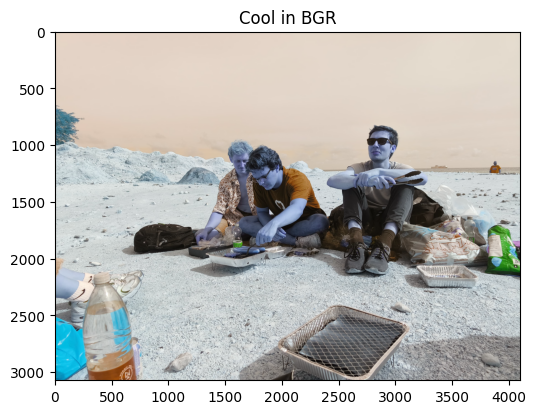

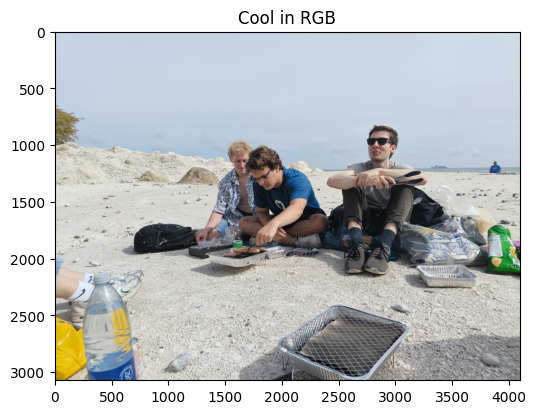

In [57]:
# Load an image using OpenCV
image = cv2.imread("cool.jpeg")

# Display original image
display_image(image, title="Cool in BGR")

# Convert the image from BGR to RGB
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Display the image
display_image(image_rgb, title="Cool in RGB")

## Data indexing 

In [58]:
# Load an image using OpenCV
image = cv2.imread("cool.jpeg")

# Convert the image from BGR to RGB
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Data indexing
pixel = [1500, 1500]

# Get the pixel value at the specified index
pixel_value = image_rgb[pixel[0], pixel[1]]

# Display the pixel value
print(f"Pixel value at index {pixel}: {pixel_value}") # In RGB

Pixel value at index [1500, 1500]: [10 23 55]


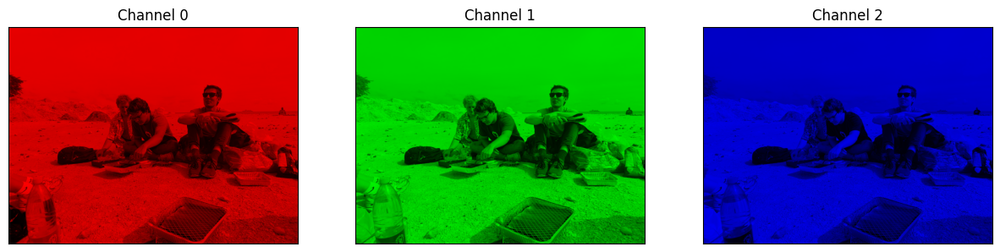

In [59]:
# Display R, G and B images
plt.figure(figsize=(15, 5))

for i in range(3):
    channel = np.zeros_like(image)
    channel[:,:,i] = image[:,:,i]
    plt.subplot(1,3,i+1), plt.imshow(channel)
    plt.title(f"Channel {i}"), plt.xticks([]), plt.yticks([])
    plt.xticks([]),plt.yticks([])
plt.show()

## Crop image

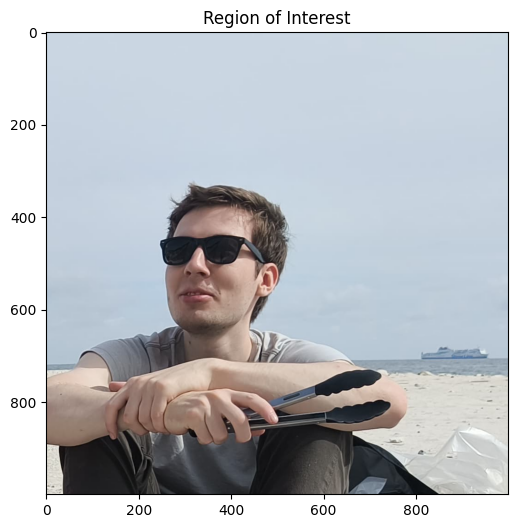

In [60]:
# Load an image using OpenCV
image = cv2.imread("cool.jpeg")

# Convert the image from BGR to RGB
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# ROI
roi = image_rgb[500:1500, 2500:3500]

# Display the ROI
display_image(roi, title="Region of Interest")

## Resize the image

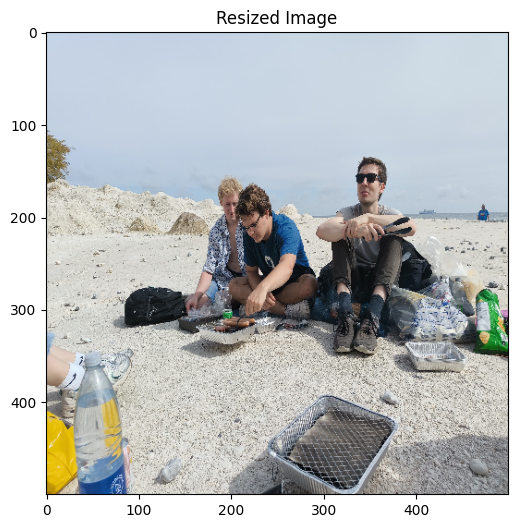

In [61]:
# Load an image using OpenCV
image = cv2.imread("cool.jpeg")

# Convert the image from BGR to RGB
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Resize the image
image_resized = cv2.resize(image_rgb, (500, 500))

# Display the resized image
display_image(image_resized, title="Resized Image")

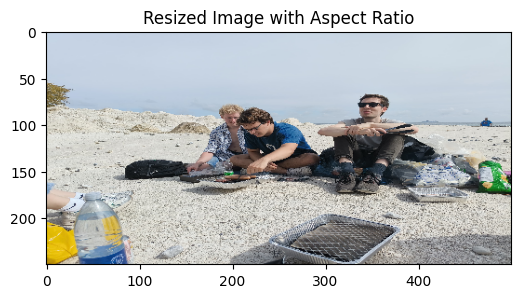

In [62]:
# Resize maintaining aspect ratio
aspect_ratio = 2
width = 500
height = int(width / aspect_ratio)

# Resize the image
image_resized = cv2.resize(image_rgb, (width, height))

# Display the resized image
display_image(image_resized, title="Resized Image with Aspect Ratio")

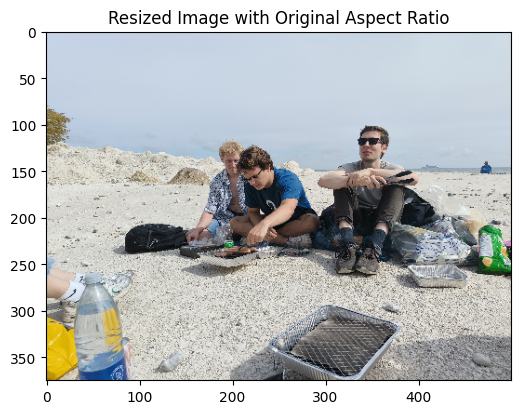

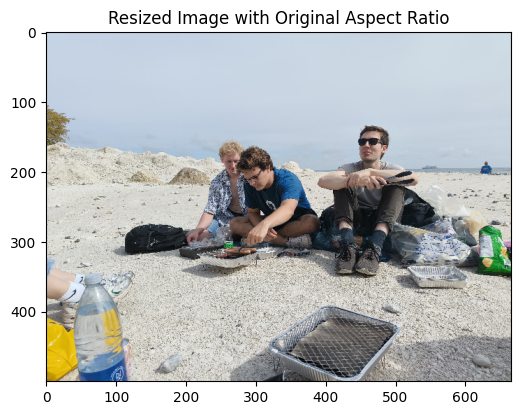

In [63]:
# Resize maintaining original aspect ratio of the image
width = 500
height = int(image_rgb.shape[0] / image_rgb.shape[1] * width)

# Resize the image
image_resized = cv2.resize(image_rgb, (width, height))

# Display the resized image
display_image(image_resized, title="Resized Image with Original Aspect Ratio")

# Other dimension
height = 500
width = int(image_rgb.shape[1] / image_rgb.shape[0] * height)

# Resize the image
image_resized = cv2.resize(image_rgb, (width, height))

# Display the resized image
display_image(image_resized, title="Resized Image with Original Aspect Ratio")

## Rotation

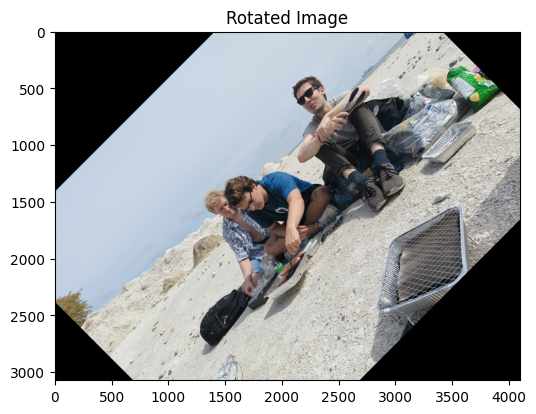

In [64]:
# Load an image using OpenCV
image = cv2.imread("cool.jpeg")

# Convert the image from BGR to RGB
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Rotate the image
angle = 45
image_rotated = imutils.rotate(image_rgb, angle)

# Display the rotated image
display_image(image_rotated, title="Rotated Image")

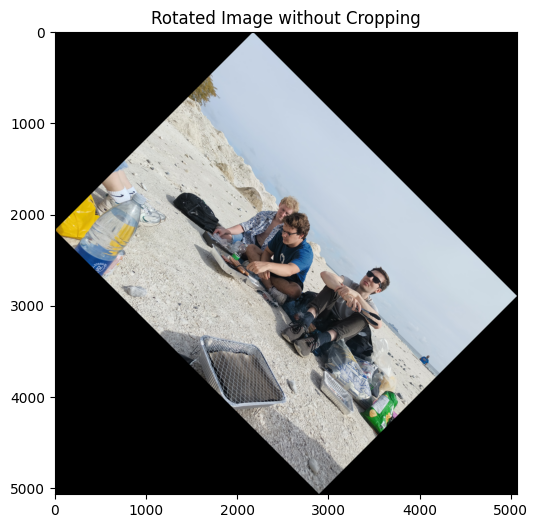

In [65]:
# Rotation withou cropping
image_rotated = imutils.rotate_bound(image_rgb, angle)

# Display the rotated image
display_image(image_rotated, title="Rotated Image without Cropping")

## Apply Kernels to image (correlation)

In [66]:
def apply_kernel(image, kernel):
    """
    Apply a kernel (filter) to an image with correlation.

    Args:
        image (numpy.ndarray): Input image.
        kernel (numpy.ndarray): Correlation kernel (filter).

    Returns:
        numpy.ndarray: Image after applying the kernel.
    """
    # Validate inputs
    if image is None or not isinstance(image, np.ndarray):
        raise ValueError("Invalid image. Must be a numpy.ndarray.")
    if kernel is None or not isinstance(kernel, np.ndarray):
        raise ValueError("Invalid kernel. Must be a numpy.ndarray.")
    
    # Apply the kernel using OpenCV's filter2D function
    #filtered_image = cv2.filter2D(src=image, ddepth=-1, kernel=kernel)
    filtered_image = cv2.filter2D(src=image, ddepth=-1, kernel=kernel, borderType=cv2.BORDER_CONSTANT)
    
    return filtered_image

In [67]:
# Load an image using OpenCV
image = cv2.imread("cool.jpeg")

# Convert the image from BGR to RGB
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

### Mean kernel

Kernel:
[[9.803e-05 9.803e-05 9.803e-05 ... 9.803e-05 9.803e-05 9.803e-05]
 [9.803e-05 9.803e-05 9.803e-05 ... 9.803e-05 9.803e-05 9.803e-05]
 [9.803e-05 9.803e-05 9.803e-05 ... 9.803e-05 9.803e-05 9.803e-05]
 ...
 [9.803e-05 9.803e-05 9.803e-05 ... 9.803e-05 9.803e-05 9.803e-05]
 [9.803e-05 9.803e-05 9.803e-05 ... 9.803e-05 9.803e-05 9.803e-05]
 [9.803e-05 9.803e-05 9.803e-05 ... 9.803e-05 9.803e-05 9.803e-05]]


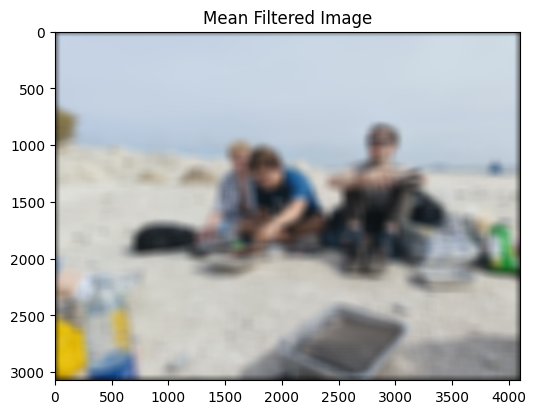

In [68]:
# Mean filter
kernel_size = 101
kernel = np.ones((kernel_size, kernel_size), np.float32) / (kernel_size**2)

# Print the kernel
print(f"Kernel:\n{kernel}")

# Apply the kernel to the image
image_filtered = apply_kernel(image_rgb, kernel)

# Display the filtered image
display_image(image_filtered, title="Mean Filtered Image")


### Median

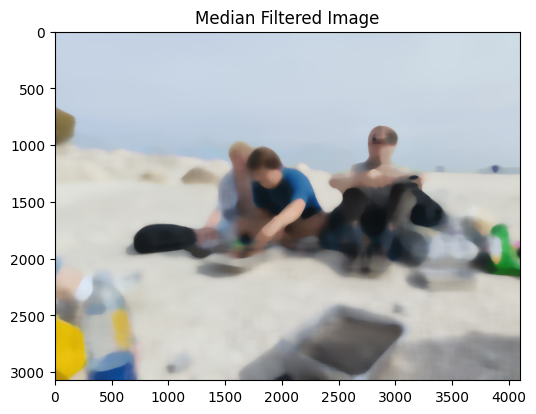

In [69]:
# Apply the median filter
kernel_size = 101  # Must be an ODD integer
median_filtered_image = cv2.medianBlur(image_rgb, ksize=kernel_size)

# Display the filtered image
display_image(median_filtered_image, title="Median Filtered Image")


### Gaussian

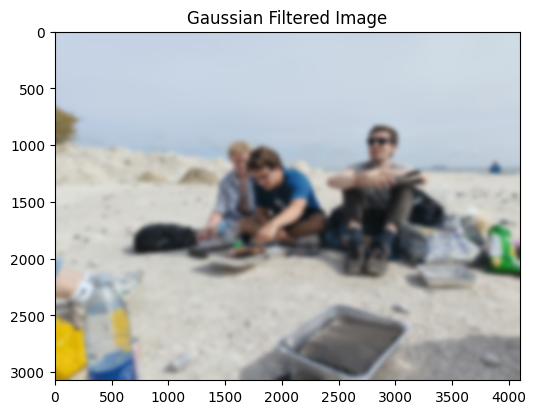

In [70]:
# Apply Gaussian filter
kernel_size = 101  # Should be an ODD integer
sigma = 20  # Standard deviation for the Gaussian kernel
gaussian_filtered_image = cv2.GaussianBlur(image_rgb, (kernel_size, kernel_size), sigma)

# Display the filtered image
display_image(gaussian_filtered_image, title="Gaussian Filtered Image")


## Apply Kernel to test image

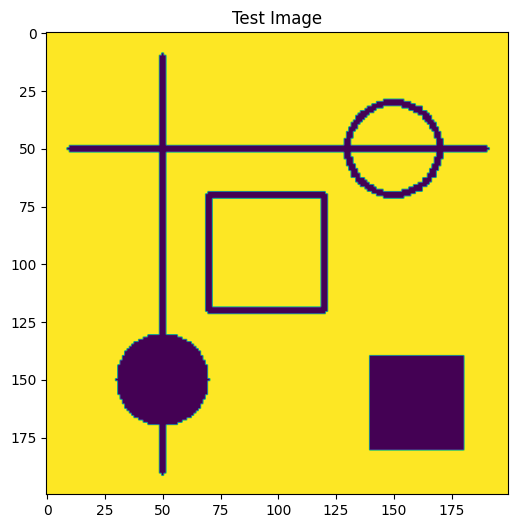

In [71]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

def create_test_image():
    """
    Creates a test image with horizontal and vertical lines, and geometric shapes
    for testing 3x3 kernels.
    
    Returns:
        numpy.ndarray: Grayscale test image.
    """
    # Create a blank white image
    image = np.ones((200, 200), dtype=np.uint8) * 255  # 200x200 pixels, white background

    # Draw horizontal and vertical lines
    cv2.line(image, (10, 50), (190, 50), color=0, thickness=2)  # Horizontal line
    cv2.line(image, (50, 10), (50, 190), color=0, thickness=2)  # Vertical line

    # Draw rectangles
    cv2.rectangle(image, (70, 70), (120, 120), color=0, thickness=2)  # Hollow rectangle
    cv2.rectangle(image, (140, 140), (180, 180), color=0, thickness=-1)  # Filled rectangle

    # Draw circles
    cv2.circle(image, (150, 50), radius=20, color=0, thickness=2)  # Hollow circle
    cv2.circle(image, (50, 150), radius=20, color=0, thickness=-1)  # Filled circle

    return image

# Generate the test image
test_image = create_test_image()

# Display the test image
display_image(test_image, title="Test Image")

### Gradient kernels

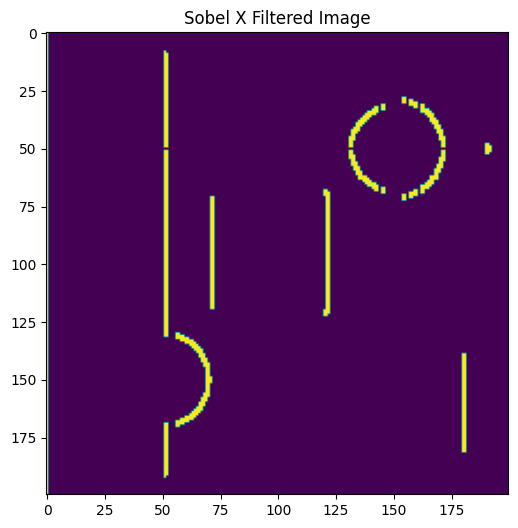

In [72]:
# X-axis Sobel kernel (Horizontal gradient, detects vertical edges)
sobel_x = np.array([[-1, 0, 1],
                    [-2, 0, 2],
                    [-1, 0, 1]], dtype=np.float32)

# Apply the kernel to the test image
sobel_x_image = apply_kernel(test_image, sobel_x)

# Display the filtered image
display_image(sobel_x_image, title="Sobel X Filtered Image")


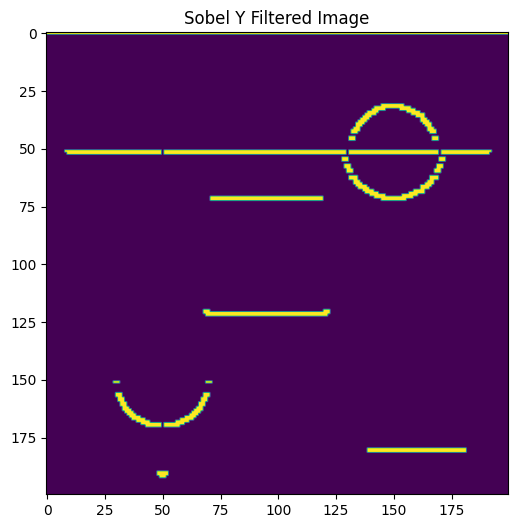

In [73]:
# Y-axis Sobel kernel (Vertical gradient, detects horizontal edges)
sobel_y = np.array([[-1, -2, -1],
                    [ 0,  0,  0],
                    [ 1,  2,  1]], dtype=np.float32)

# Apply the kernel to the test image
sobel_y_image = apply_kernel(test_image, sobel_y)

# Display the filtered image
display_image(sobel_y_image, title="Sobel Y Filtered Image")

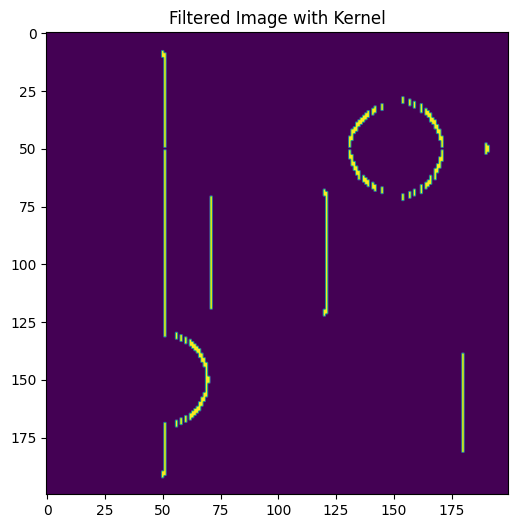

In [74]:
# Random kernel
kernel = np.array([[ 0, -1,  1],
                    [ 0, -1,  1],
                    [ 0, -1,  1]], dtype=np.float32)

# Apply the kernel to the test image
filtered_image = apply_kernel(test_image, kernel)

# Display the filtered image
display_image(filtered_image, title="Filtered Image with Kernel")

## Sharpening

In [75]:
import numpy as np

def generate_sharpening_kernel(alpha):
    """
    Generate a sharpening kernel based on the given alpha using the formula:
    f_sharp = ((1 + alpha) * w) - (alpha * v)

    Args:
        alpha (float): Strength of sharpening. Higher values increase sharpening.

    Returns:
        numpy.ndarray: Sharpening kernel.
    """
    # Identity kernel (w)
    w = np.array([[0, 0, 0],
                  [0, 1, 0],
                  [0, 0, 0]], dtype=np.float32)

    # Mean filter kernel (v)
    v = np.ones((3, 3), dtype=np.float32) / 9

    # Calculate the sharpening kernel
    sharpening_kernel = (1 + alpha) * w - alpha * v

    return sharpening_kernel


Sharpening Kernel:
[[-5.556e+01 -5.556e+01 -5.556e+01]
 [-5.556e+01 4.454e+02 -5.556e+01]
 [-5.556e+01 -5.556e+01 -5.556e+01]]


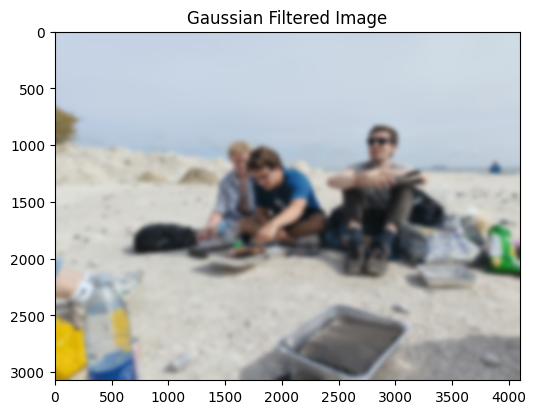

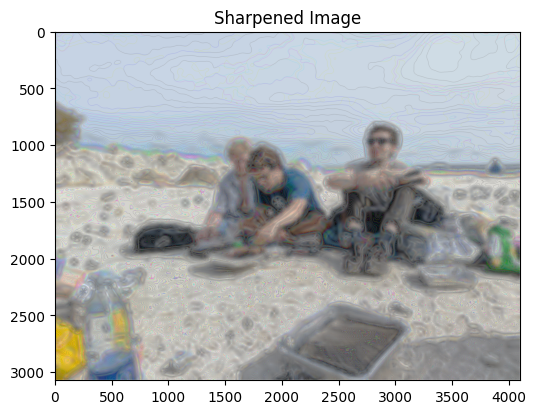

In [76]:
# Sharpening kernel
alpha = 500  # Sharpening strength
sharpen_kernel = generate_sharpening_kernel(alpha)

# Print the kernel
print("Sharpening Kernel:")
print(sharpen_kernel)

# Apply the kernel to gaussian_filtered_image
sharpened_image = apply_kernel(gaussian_filtered_image, sharpen_kernel)

# Gaussian filtered image
display_image(gaussian_filtered_image, title="Gaussian Filtered Image")

# Display the sharpened image
display_image(sharpened_image, title="Sharpened Image")

## Apply convolution

In [77]:
import numpy as np
import cv2

def apply_convolution(image, kernel):
    """
    Apply convolution to an image using a given kernel.

    Args:
        image (numpy.ndarray): Input image.
        kernel (numpy.ndarray): Convolution kernel.

    Returns:
        numpy.ndarray: Image after applying the convolution.
    """
    # Validate inputs
    if image is None or not isinstance(image, np.ndarray):
        raise ValueError("Invalid image. Must be a numpy.ndarray.")
    if kernel is None or not isinstance(kernel, np.ndarray):
        raise ValueError("Invalid kernel. Must be a numpy.ndarray.")

    # Flip the kernel both horizontally and vertically for convolution
    flipped_kernel = np.flipud(np.fliplr(kernel))

    # Apply the kernel using OpenCV's filter2D function
    convolved_image = cv2.filter2D(src=image, ddepth=-1, kernel=flipped_kernel, borderType=cv2.BORDER_CONSTANT)
    
    return convolved_image


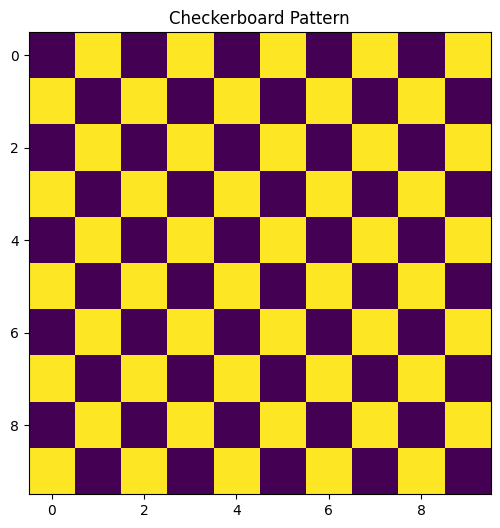

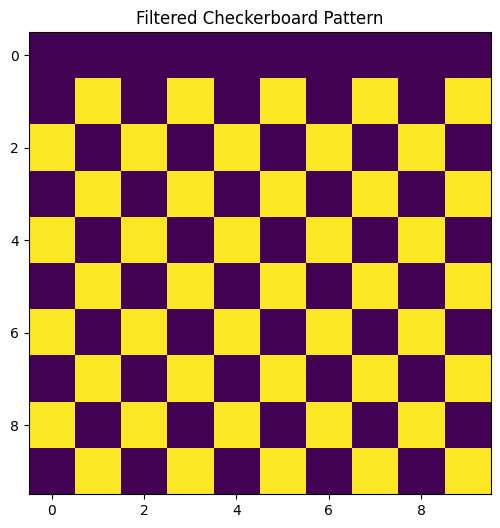

In [78]:
# Create a 10x10 checkerboard pattern
checkerboard = np.zeros((10, 10), dtype=np.uint8)
checkerboard[1::2, ::2] = 1  # Fill odd rows, even columns
checkerboard[::2, 1::2] = 1  # Fill even rows, odd columns

# Display the checkerboard pattern
display_image(checkerboard, title="Checkerboard Pattern")

# Apply convolution to checkerboard pattern
kernel = np.array([[0, 0, 0],
                   [0, 0, 0],
                   [0, 1, 0]], dtype=np.float32)

# Apply the kernel to the checkerboard pattern
filtered_checkerboard = apply_convolution(checkerboard, kernel)

# Display the filtered checkerboard pattern
display_image(filtered_checkerboard, title="Filtered Checkerboard Pattern")

# Hough

## Hough Line Detection

Converting the image to grayscale for processing...
Applying Canny edge detection...
Canny edge detection parameters: threshold1=100, threshold2=200
Applying Hough Line Transform...
Hough Transform parameters: rho=1, theta=0.0017, threshold=200
Detected lines (rho, theta):
Number of lines detected: 32
Drawing the detected lines on the image...
Line 1: rho=-225.00, theta=2.7353, points=(-188, -1007) to (601, 829)
Line 2: rho=604.00, theta=0.3264, points=(251, 1140) to (892, -753)
Line 3: rho=-224.00, theta=2.7336, points=(-191, -1006) to (602, 829)
Line 4: rho=841.00, theta=1.1679, points=(-590, 1165) to (1249, 381)
Line 5: rho=-226.00, theta=2.7370, points=(-185, -1008) to (601, 830)
Line 6: rho=840.00, theta=1.1696, points=(-592, 1163) to (1248, 382)
Line 7: rho=363.00, theta=0.4080, points=(-63, 1061) to (729, -773)
Line 8: rho=257.00, theta=0.4403, points=(-193, 1014) to (658, -795)
Line 9: rho=232.00, theta=1.9125, points=(-1019, -116) to (864, 553)
Line 10: rho=367.00, theta=0.406

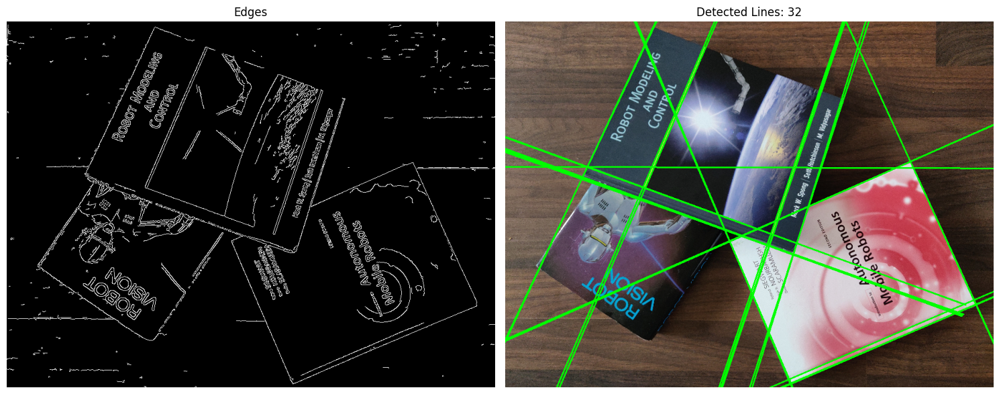

Successfully detected and drew 32 line(s) on the image.


In [79]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image (ensure the file path is correct)
image = cv2.imread(r'C:\Users\User\Documents\GitHub\pfas\helper_functions\ExamFiles2021\Exam Files\Question_10\books.png')

# Step 1: Convert to grayscale
print("Converting the image to grayscale for processing...")
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Step 2: Apply Canny edge detection
print("Applying Canny edge detection...")
threshold1 = 100  # Lower threshold for edges
threshold2 = 200  # Upper threshold for edges
edges = cv2.Canny(gray_image, threshold1=threshold1, threshold2=threshold2)
print(f"Canny edge detection parameters: threshold1={threshold1}, threshold2={threshold2}")

# Step 3: Apply Hough Line Transform
print("Applying Hough Line Transform...")
rho = 1  # Distance resolution of the accumulator in pixels
theta = 0.0017  # Angular resolution in radians
hough_threshold = 200  # Minimum number of votes for a line
lines = cv2.HoughLines(edges, rho=rho, theta=theta, threshold=hough_threshold)
print(f"Hough Transform parameters: rho={rho}, theta={theta}, threshold={hough_threshold}")
print("Detected lines (rho, theta):")

# Step 4: Count the number of lines detected
num_lines = 0 if lines is None else len(lines)
print(f"Number of lines detected: {num_lines}")

# Step 5: Draw the detected lines on a copy of the original image
print("Drawing the detected lines on the image...")
output_image = image.copy()
if lines is not None:
    for idx, line in enumerate(lines):
        rho, theta = line[0]
        a = np.cos(theta)
        b = np.sin(theta)
        x0 = a * rho
        y0 = b * rho
        x1 = int(x0 + 1000 * (-b))
        y1 = int(y0 + 1000 * (a))
        x2 = int(x0 - 1000 * (-b))
        y2 = int(y0 - 1000 * (a))
        cv2.line(output_image, (x1, y1), (x2, y2), (0, 255, 0), 2)
        print(f"Line {idx + 1}: rho={rho:.2f}, theta={theta:.4f}, points=({x1}, {y1}) to ({x2}, {y2})")

# Step 6: Convert images to RGB for matplotlib (OpenCV uses BGR by default)
print("Preparing images for display...")
edges_rgb = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)
output_image_rgb = cv2.cvtColor(output_image, cv2.COLOR_BGR2RGB)

# Step 7: Display images inline
print("Displaying the edges and detected lines...")
plt.figure(figsize=(15, 10))

# Show the edges
plt.subplot(1, 2, 1)
plt.imshow(edges_rgb)
plt.title('Edges')
plt.axis('off')

# Show the detected lines
plt.subplot(1, 2, 2)
plt.imshow(output_image_rgb)
plt.title(f'Detected Lines: {num_lines}')
plt.axis('off')

plt.tight_layout()
plt.show()

# Final printout
if num_lines > 0:
    print(f"Successfully detected and drew {num_lines} line(s) on the image.")
else:
    print("No lines were detected.")


## Hough Circle Detection

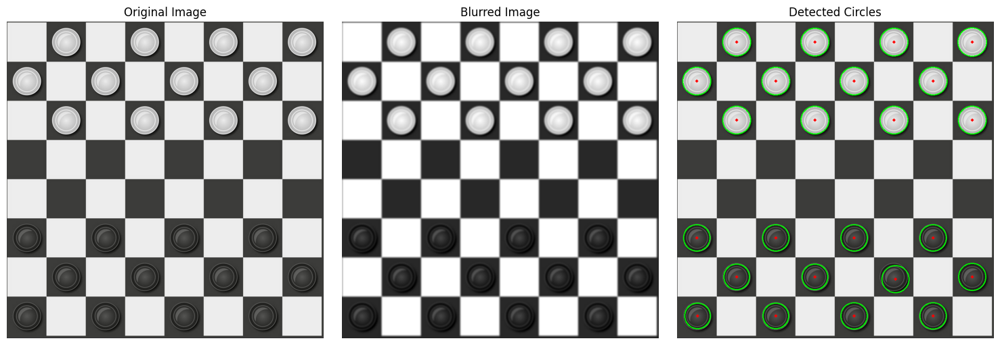

Circles detected:
Circle 1: Center = (470, 576), Radius = 35
Circle 2: Center = (784, 262), Radius = 37
Circle 3: Center = (366, 54), Radius = 37
Circle 4: Center = (158, 54), Radius = 37
Circle 5: Center = (262, 576), Radius = 35
Circle 6: Center = (52, 158), Radius = 37
Circle 7: Center = (576, 54), Radius = 37
Circle 8: Center = (470, 158), Radius = 37
Circle 9: Center = (784, 54), Radius = 38
Circle 10: Center = (262, 158), Radius = 37
Circle 11: Center = (366, 262), Radius = 37
Circle 12: Center = (52, 576), Radius = 35
Circle 13: Center = (680, 784), Radius = 35
Circle 14: Center = (470, 784), Radius = 35
Circle 15: Center = (680, 576), Radius = 35
Circle 16: Center = (158, 262), Radius = 37
Circle 17: Center = (680, 158), Radius = 37
Circle 18: Center = (576, 262), Radius = 37
Circle 19: Center = (158, 680), Radius = 34
Circle 20: Center = (262, 784), Radius = 34
Circle 21: Center = (366, 680), Radius = 34
Circle 22: Center = (54, 784), Radius = 34
Circle 23: Center = (784, 680)

In [80]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Step 1: Load the image
# Ensure the file path is correct
image = cv2.imread(r'C:\Users\User\Documents\GitHub\pfas\helper_functions\checkers.png')

# Step 2: Convert the image to grayscale
# Hough Circle Transform works on grayscale images
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Step 3: Apply Gaussian Blur
# Parameters: (ksize=(9, 9), sigmaX=2) -> The kernel size and sigma value for blurring
blurred = cv2.GaussianBlur(gray, (9, 9), 2)

# Step 4: Apply the Hough Circle Transform
# Parameters:
# 1. `image`: Input grayscale image (after Gaussian blur)
# 2. `method`: Detection method (cv2.HOUGH_GRADIENT is the only available method)
# 3. `dp`: Inverse ratio of the accumulator resolution to the image resolution (suggested values: 1-2)
# 4. `minDist`: Minimum distance between the centers of detected circles (in pixels)
# 5. `param1`: Higher threshold for the Canny edge detector (suggested values: 100-200)
# 6. `param2`: Accumulator threshold for circle detection. Smaller values detect more circles (suggested: 20-100)
# 7. `minRadius`: Minimum radius of circles to detect (in pixels)
# 8. `maxRadius`: Maximum radius of circles to detect (in pixels)
circles = cv2.HoughCircles(blurred, 
                           cv2.HOUGH_GRADIENT, 
                           dp=1, 
                           minDist=50, 
                           param1=50, 
                           param2=40, 
                           minRadius=30, 
                           maxRadius=80)

# Step 5: Draw the detected circles
# Copy the original image for drawing
output = image.copy()

# Ensure circles were detected
if circles is not None:
    # Convert circle parameters to integers
    circles = np.uint16(np.around(circles))
    for circle in circles[0, :]:
        # Draw the outer circle
        cv2.circle(output, (circle[0], circle[1]), circle[2], (0, 255, 0), 2)
        # Draw the center of the circle
        cv2.circle(output, (circle[0], circle[1]), 2, (0, 0, 255), 3)

# Step 6: Display the results
# Display original, blurred, and output image
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.title("Original Image")
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title("Blurred Image")
plt.imshow(blurred, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title("Detected Circles")
plt.imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.tight_layout()
plt.show()

# Step 7: Print relevant information
# Print circle information if detected
if circles is not None:
    print("Circles detected:")
    for i, circle in enumerate(circles[0, :]):
        print(f"Circle {i + 1}: Center = ({circle[0]}, {circle[1]}), Radius = {circle[2]}")
else:
    print("No circles detected.")


# Corner Detector

## Harris Corner Detector

Loading the image...
Converting the image to grayscale for processing...
Applying Harris Corner Detection...
Harris Corner Detection parameters: block_size=2, ksize=3, k=0.04
Number of corners detected above the threshold: 188
Highlighting detected corners on the original image...
Sample coordinates of detected corners (first 10): [[213 591]
 [218 589]
 [221 597]
 [221 598]
 [232 594]
 [253 579]
 [254 577]
 [261 575]
 [261 576]
 [272 571]]
Displaying the grayscale image and corners detected...


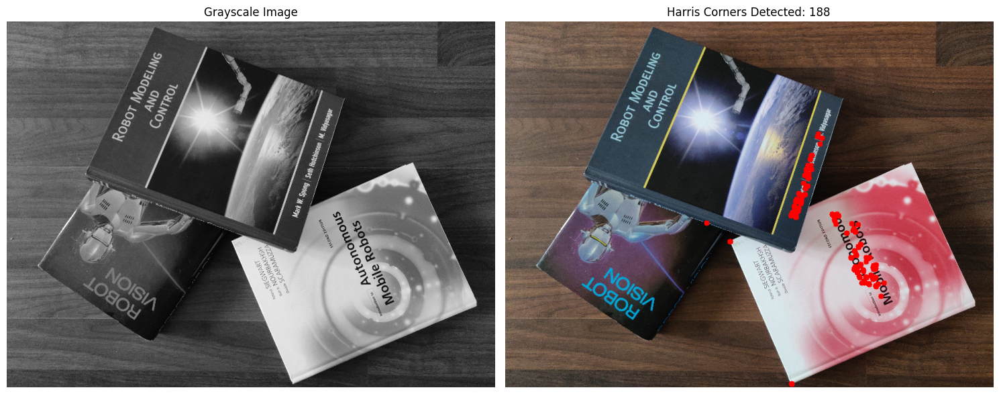

Successfully detected and highlighted 188 corners on the image.


In [81]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Step 1: Load the image
print("Loading the image...")
image = cv2.imread(r'C:\Users\User\Documents\GitHub\pfas\helper_functions\ExamFiles2021\Exam Files\Question_10\books.png')

# Step 2: Convert the image to grayscale
print("Converting the image to grayscale for processing...")
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Step 3: Apply Harris Corner Detection
print("Applying Harris Corner Detection...")
block_size = 2  # Size of the neighborhood considered for corner detection
ksize = 3  # Aperture parameter for Sobel operator
k = 0.04  # Harris detector free parameter
harris_corners = cv2.cornerHarris(src=gray_image, blockSize=block_size, ksize=ksize, k=k)
print(f"Harris Corner Detection parameters: block_size={block_size}, ksize={ksize}, k={k}")

# Step 4: Apply thresholding to identify significant corners
""" threshold = 0.01 * harris_corners.max()  # Threshold as a fraction of the maximum value
print(f"Threshold for significant corners: {threshold:.4f}") """
threshold = 0.01

above_threshold = np.sum(harris_corners > threshold)
print(f"Number of corners detected above the threshold: {above_threshold}")

# Step 5: Highlight corners on the original image
print("Highlighting detected corners on the original image...")
image_with_corners = image.copy()
corner_points = np.argwhere(harris_corners > threshold)  # Get coordinates of corners
print(f"Sample coordinates of detected corners (first 10): {corner_points[:10]}")

# Draw detected corners as red circles on the image
for point in corner_points:
    y, x = point
    cv2.circle(image_with_corners, (x, y), radius=5, color=(0, 0, 255), thickness=-1)

# Step 6: Display results using Matplotlib
print("Displaying the grayscale image and corners detected...")
plt.figure(figsize=(15, 10))

# Grayscale Image
plt.subplot(1, 2, 1)
plt.imshow(gray_image, cmap='gray')
plt.title('Grayscale Image')
plt.axis('off')

# Harris Corners
plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(image_with_corners, cv2.COLOR_BGR2RGB))
plt.title(f'Harris Corners Detected: {above_threshold}')
plt.axis('off')

plt.tight_layout()
plt.show()

# Final printout
if above_threshold > 0:
    print(f"Successfully detected and highlighted {above_threshold} corners on the image.")
else:
    print("No significant corners were detected.")


## Shi-Tomasi

Loading the image...
Converting the image to grayscale for processing...
Applying Shi-Tomasi Corner Detection...
Shi-Tomasi parameters: max_corners=100, quality_level=0.01, min_distance=10
Number of corners detected: 100
Highlighting detected corners on the original image...
Sample coordinates of detected corners (first 10): [[668 482]
 [694 485]
 [662 441]
 [699 499]
 [686 495]
 [659 468]
 [680 482]
 [666 425]
 [425 415]
 [695 467]]
Displaying the grayscale image and corners detected...


C:\Users\User\AppData\Local\Temp\ipykernel_22448\3698428524.py:36: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  corners = np.int0(corners)  # Convert corner coordinates to integers


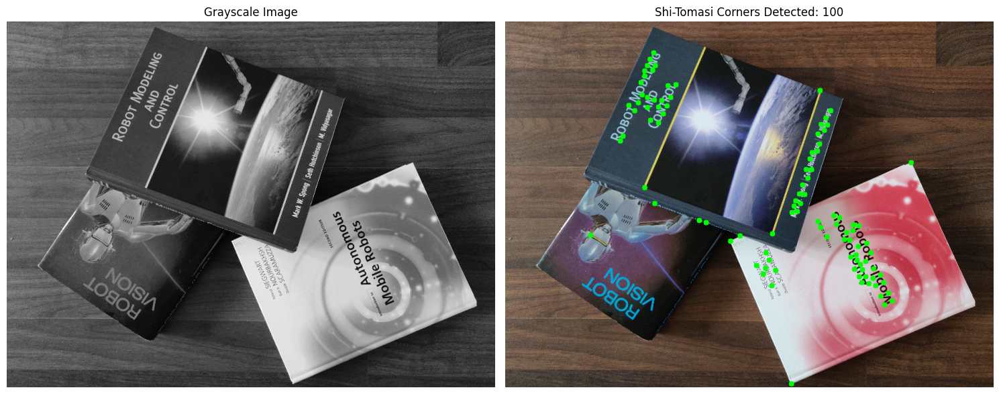

Successfully detected and highlighted 100 corners on the image.


In [82]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Step 1: Load the image
print("Loading the image...")
image = cv2.imread(r'C:\Users\User\Documents\GitHub\pfas\helper_functions\ExamFiles2021\Exam Files\Question_10\books.png')

# Step 2: Convert the image to grayscale
print("Converting the image to grayscale for processing...")
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Step 3: Apply Shi-Tomasi Corner Detection
print("Applying Shi-Tomasi Corner Detection...")
max_corners = 100  # Maximum number of corners to return
quality_level = 0.01  # Minimum accepted quality of corners (as a fraction of the max corner quality)
min_distance = 10  # Minimum distance between detected corners
corners = cv2.goodFeaturesToTrack(gray_image, 
                                   maxCorners=max_corners, 
                                   qualityLevel=quality_level, 
                                   minDistance=min_distance)
print(f"Shi-Tomasi parameters: max_corners={max_corners}, quality_level={quality_level}, min_distance={min_distance}")

# Step 4: Count detected corners
if corners is not None:
    num_corners = len(corners)
    print(f"Number of corners detected: {num_corners}")
else:
    num_corners = 0
    print("No corners detected.")

# Step 5: Highlight corners on the original image
print("Highlighting detected corners on the original image...")
image_with_corners = image.copy()
if corners is not None:
    corners = np.int0(corners)  # Convert corner coordinates to integers
    print(f"Sample coordinates of detected corners (first 10): {corners[:10].reshape(-1, 2)}")
    for corner in corners:
        x, y = corner.ravel()  # Flatten the array to get x, y coordinates
        cv2.circle(image_with_corners, (x, y), radius=5, color=(0, 255, 0), thickness=-1)

# Step 6: Display results using Matplotlib
print("Displaying the grayscale image and corners detected...")
plt.figure(figsize=(15, 10))

# Grayscale Image
plt.subplot(1, 2, 1)
plt.imshow(gray_image, cmap='gray')
plt.title('Grayscale Image')
plt.axis('off')

# Shi-Tomasi Corners
plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(image_with_corners, cv2.COLOR_BGR2RGB))
plt.title(f'Shi-Tomasi Corners Detected: {num_corners}')
plt.axis('off')

plt.tight_layout()
plt.show()

# Final printout
if num_corners > 0:
    print(f"Successfully detected and highlighted {num_corners} corners on the image.")
else:
    print("No significant corners were detected.")


## Harris - Shi Tomasi Comparison

Loading the image...
Converting the image to grayscale...
Applying Harris Corner Detection...
Harris Corner Detection:
  Parameters: block_size=2, ksize=3, k=0.04
  Threshold: 0.0100
  Number of corners detected: 188
  Sample corners (first 10): [[213 591]
 [218 589]
 [221 597]
 [221 598]
 [232 594]
 [253 579]
 [254 577]
 [261 575]
 [261 576]
 [272 571]]

Applying Shi-Tomasi Corner Detection...
Shi-Tomasi Corner Detection:
  Parameters: max_corners=100, quality_level=0.01, min_distance=10
  Number of corners detected: 100
  Sample corners (first 10): [[668 482]
 [694 485]
 [662 441]
 [699 499]
 [686 495]
 [659 468]
 [680 482]
 [666 425]
 [425 415]
 [695 467]]


C:\Users\User\AppData\Local\Temp\ipykernel_22448\1208904847.py:47: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  shi_corners = np.int0(shi_corners)


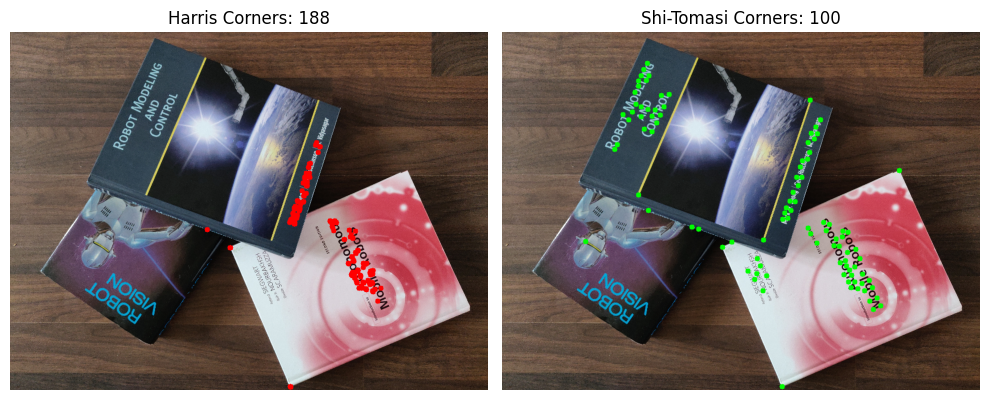

In [83]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
print("Loading the image...")
image = cv2.imread(r'C:\Users\User\Documents\GitHub\pfas\helper_functions\ExamFiles2021\Exam Files\Question_10\books.png')

# Convert the image to grayscale
print("Converting the image to grayscale...")
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Harris Corner Detection
print("Applying Harris Corner Detection...")
harris_block_size = 2
harris_ksize = 3
harris_k = 0.04
harris_threshold = 0.01  # Threshold for significant corners

harris_corners = cv2.cornerHarris(src=gray_image, blockSize=harris_block_size, ksize=harris_ksize, k=harris_k)
harris_threshold_value = harris_threshold
harris_points = np.argwhere(harris_corners > harris_threshold_value)

# Draw Harris corners
image_harris = image.copy()
for point in harris_points:
    y, x = point
    cv2.circle(image_harris, (x, y), radius=5, color=(0, 0, 255), thickness=-1)

# Print Harris metrics
print(f"Harris Corner Detection:")
print(f"  Parameters: block_size={harris_block_size}, ksize={harris_ksize}, k={harris_k}")
print(f"  Threshold: {harris_threshold_value:.4f}")
print(f"  Number of corners detected: {len(harris_points)}")
print(f"  Sample corners (first 10): {harris_points[:10]}")

# Shi-Tomasi Corner Detection
print("\nApplying Shi-Tomasi Corner Detection...")
shi_max_corners = 100
shi_quality_level = 0.01
shi_min_distance = 10

shi_corners = cv2.goodFeaturesToTrack(gray_image, maxCorners=shi_max_corners, qualityLevel=shi_quality_level, minDistance=shi_min_distance)
image_shi = image.copy()

if shi_corners is not None:
    shi_corners = np.int0(shi_corners)
    for corner in shi_corners:
        x, y = corner.ravel()
        cv2.circle(image_shi, (x, y), radius=5, color=(0, 255, 0), thickness=-1)

# Print Shi-Tomasi metrics
print(f"Shi-Tomasi Corner Detection:")
print(f"  Parameters: max_corners={shi_max_corners}, quality_level={shi_quality_level}, min_distance={shi_min_distance}")
print(f"  Number of corners detected: {len(shi_corners)}")
print(f"  Sample corners (first 10): {shi_corners[:10].reshape(-1, 2)}")

# Visual comparison of results
plt.figure(figsize=(10, 5))

# Harris corners
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(image_harris, cv2.COLOR_BGR2RGB))
plt.title(f'Harris Corners: {len(harris_points)}')
plt.axis('off')

# Shi-Tomasi corners
plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(image_shi, cv2.COLOR_BGR2RGB))
plt.title(f'Shi-Tomasi Corners: {len(shi_corners)}')
plt.axis('off')

plt.tight_layout()
plt.show()


# Optical flow

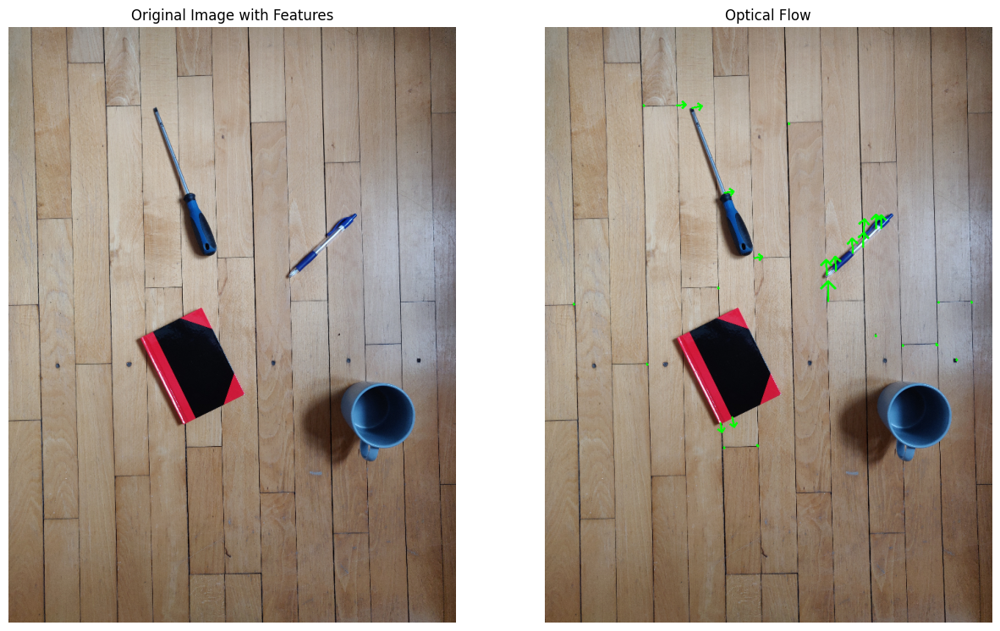

Number of features detected: 27
Number of valid optical flow points: 27
Maximum horizontal movement (x direction): 15.6368408203125 pixels
Maximum vertical movement (y direction): 30.4580078125 pixels
Sample feature points and their movements (x, y):
Feature 0: Start=(271.00, 613.00), End=(273.77, 627.68), Movement=(2.77, 14.68)
Feature 1: Start=(475.00, 350.00), End=(474.99, 328.98), Movement=(-0.01, -21.02)
Feature 2: Start=(267.00, 403.00), End=(268.60, 405.71), Movement=(1.60, 2.71)
Feature 3: Start=(519.00, 312.00), End=(519.90, 292.08), Movement=(0.90, -19.92)
Feature 4: Start=(323.00, 358.00), End=(335.87, 356.70), Movement=(12.87, -1.30)
Feature 5: Start=(511.00, 312.00), End=(511.73, 291.92), Movement=(0.73, -20.08)
Feature 6: Start=(327.00, 647.00), End=(329.15, 649.68), Movement=(2.15, 2.68)
Feature 7: Start=(607.00, 426.00), End=(608.48, 427.98), Movement=(1.48, 1.98)
Feature 8: Start=(510.00, 477.00), End=(511.69, 479.69), Movement=(1.69, 2.69)
Feature 9: Start=(492.00, 31

In [84]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the two images
image1 = cv2.imread(r'C:\Users\User\Documents\GitHub\pfas\helper_functions\ExamFiles2021\Exam Files\Question_12\things1.png')
image2 = cv2.imread(r'C:\Users\User\Documents\GitHub\pfas\helper_functions\ExamFiles2021\Exam Files\Question_12\things2.png')

# Convert the images to grayscale
gray1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

# Detect features on the first image using cv2.goodFeaturesToTrack
features = cv2.goodFeaturesToTrack(gray1, maxCorners=100, qualityLevel=0.3, minDistance=7)

# Apply sparse optical flow using cv2.calcOpticalFlowPyrLK
features_next, status, error = cv2.calcOpticalFlowPyrLK(gray1, gray2, features, None)

# Calculate movement in the x direction
movement_x = features_next[:, 0, 0] - features[:, 0, 0]  # x-coordinates difference
max_movement_x = np.max(np.abs(movement_x))  # Maximum horizontal movement

# Calculate movement in the y direction
movement_y = features_next[:, 0, 1] - features[:, 0, 1]  # y-coordinates difference
max_movement_y = np.max(np.abs(movement_y))  # Maximum vertical movement

# Visualize the optical flow
output_image = image1.copy()
for i, (pt1, pt2) in enumerate(zip(features, features_next)):
    if status[i]:  # Check if the flow is valid
        x1, y1 = pt1.ravel()
        x2, y2 = pt2.ravel()
        cv2.arrowedLine(output_image, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2, tipLength=0.5)

# Display the results
plt.figure(figsize=(15, 10))

# Original features
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(image1, cv2.COLOR_BGR2RGB))
plt.title('Original Image with Features')
plt.axis('off')

# Optical flow visualization
plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(output_image, cv2.COLOR_BGR2RGB))
plt.title('Optical Flow')
plt.axis('off')

plt.show()

# Print relevant information
print(f"Number of features detected: {len(features)}")
print(f"Number of valid optical flow points: {np.sum(status)}")
print(f"Maximum horizontal movement (x direction): {max_movement_x} pixels")
print(f"Maximum vertical movement (y direction): {max_movement_y} pixels")
print("Sample feature points and their movements (x, y):")
for i, (pt1, pt2) in enumerate(zip(features, features_next)):
    x1, y1 = pt1.ravel()
    x2, y2 = pt2.ravel()
    print(f"Feature {i}: Start=({x1:.2f}, {y1:.2f}), End=({x2:.2f}, {y2:.2f}), Movement=({x2-x1:.2f}, {y2-y1:.2f})")


# Point Matching

## See KeyPoints

=== Image 1 Keypoints ===
Total keypoints detected: 500
Keypoint examples (up to 5):
Keypoint 1:
 - Coordinates: (189.00, 100.00)
 - Scale (size): 31.00
 - Angle (orientation): 272.60
 - Response: 0.002871
 - Octave: 0
 - Class ID: -1
Keypoint 2:
 - Coordinates: (764.00, 167.00)
 - Scale (size): 31.00
 - Angle (orientation): 81.80
 - Response: 0.004055
 - Octave: 0
 - Class ID: -1
Keypoint 3:
 - Coordinates: (340.00, 123.00)
 - Scale (size): 31.00
 - Angle (orientation): 314.80
 - Response: 0.004273
 - Octave: 0
 - Class ID: -1
Keypoint 4:
 - Coordinates: (589.00, 56.00)
 - Scale (size): 31.00
 - Angle (orientation): 230.09
 - Response: 0.003112
 - Octave: 0
 - Class ID: -1
Keypoint 5:
 - Coordinates: (87.00, 50.00)
 - Scale (size): 31.00
 - Angle (orientation): 316.11
 - Response: 0.004216
 - Octave: 0
 - Class ID: -1

=== Image 2 Keypoints ===
Total keypoints detected: 500
Keypoint examples (up to 5):
Keypoint 1:
 - Coordinates: (743.00, 166.00)
 - Scale (size): 31.00
 - Angle (orien

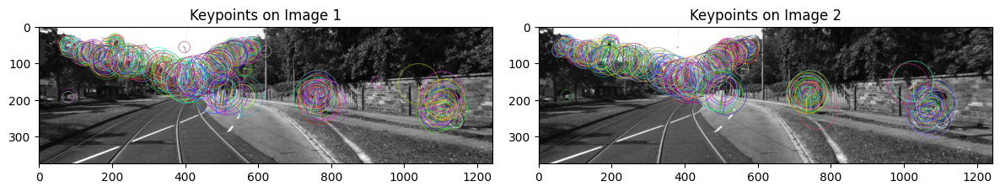

Images with keypoints saved as img1_with_keypoints.png and img2_with_keypoints.png


In [85]:
import cv2
import matplotlib.pyplot as plt

# Paths to images
img1_path = r'C:\Users\User\Documents\GitHub\pfas\helper_functions\ExamFiles2021\Exam Files\Question_18\left.png'
img2_path = r'C:\Users\User\Documents\GitHub\pfas\helper_functions\ExamFiles2021\Exam Files\Question_18\right.png'

# Load images
img1 = cv2.imread(img1_path, 0)
img2 = cv2.imread(img2_path, 0)

# Initialize ORB detector
orb = cv2.ORB_create()

# Detect keypoints and compute descriptors
kp1, des1 = orb.detectAndCompute(img1, None)
kp2, des2 = orb.detectAndCompute(img2, None)

# Draw keypoints on images
img1_with_keypoints = cv2.drawKeypoints(img1, kp1, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img2_with_keypoints = cv2.drawKeypoints(img2, kp2, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Print relevant information about keypoints
print("=== Image 1 Keypoints ===")
print(f"Total keypoints detected: {len(kp1)}")
print("Keypoint examples (up to 5):")
for i, kp in enumerate(kp1[:5]):
    print(f"Keypoint {i+1}:")
    print(f" - Coordinates: ({kp.pt[0]:.2f}, {kp.pt[1]:.2f})")
    print(f" - Scale (size): {kp.size:.2f}")
    print(f" - Angle (orientation): {kp.angle:.2f}")
    print(f" - Response: {kp.response:.6f}")
    print(f" - Octave: {kp.octave}")
    print(f" - Class ID: {kp.class_id}")

print("\n=== Image 2 Keypoints ===")
print(f"Total keypoints detected: {len(kp2)}")
print("Keypoint examples (up to 5):")
for i, kp in enumerate(kp2[:5]):
    print(f"Keypoint {i+1}:")
    print(f" - Coordinates: ({kp.pt[0]:.2f}, {kp.pt[1]:.2f})")
    print(f" - Scale (size): {kp.size:.2f}")
    print(f" - Angle (orientation): {kp.angle:.2f}")
    print(f" - Response: {kp.response:.6f}")
    print(f" - Octave: {kp.octave}")
    print(f" - Class ID: {kp.class_id}")

# Visualization
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.title("Keypoints on Image 1")
plt.imshow(cv2.cvtColor(img1_with_keypoints, cv2.COLOR_BGR2RGB))

plt.subplot(1, 2, 2)
plt.title("Keypoints on Image 2")
plt.imshow(cv2.cvtColor(img2_with_keypoints, cv2.COLOR_BGR2RGB))

plt.tight_layout()
plt.show()

# Optional: Save the images with keypoints drawn
cv2.imwrite("img1_with_keypoints.png", img1_with_keypoints)
cv2.imwrite("img2_with_keypoints.png", img2_with_keypoints)

print("Images with keypoints saved as img1_with_keypoints.png and img2_with_keypoints.png")


## SIFT - Average Epipolar Line

Keypoints in image 1: 4309
Keypoints in image 2: 4058
Total matches: 4309
Matches used: 2000
Inliers: 1577
Inlier ratio (inliers/total matches): 0.36597818519378045
Determinant of the Fundamental matrix (should be close to 0): 1.8343168817409376e-21
Fundamental matrix:
[[-1.026e-06 -1.248e-04 8.647e-02]
 [1.288e-04 6.747e-05 -1.010e+00]
 [-8.268e-02 9.828e-01 1.000e+00]]
Average epiline image 1: [-6.693e-02 9.977e-01 -1.267e+02]
Average epiline image 2: [7.029e-02 -9.975e-01 1.254e+02]
Average reprojection error: 0.6366920946910201
Match distances statistics:
  Min: 28.28
  Max: 237.20
  Mean: 144.73
  Median: 144.90


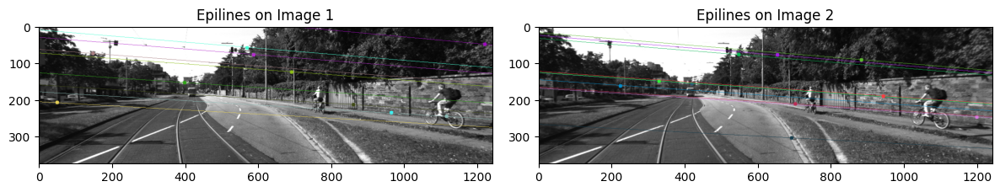

In [86]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Use xfeatures2d SIFT
sift = cv2.xfeatures2d.SIFT_create()

def draw_epilines(img, lines, pts, num_lines=10):
    img_color = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
    idx = np.random.choice(len(lines), size=min(num_lines, len(lines)), replace=False)
    for i in idx:
        r = lines[i]
        pt = pts[i]
        color = tuple(np.random.randint(0, 255, 3).tolist())
        x0, y0 = map(int, [0, -r[2] / r[1]])
        x1, y1 = map(int, [img.shape[1], -(r[2] + r[0] * img.shape[1]) / r[1]])
        img_color = cv2.line(img_color, (x0, y0), (x1, y1), color, 1)
        img_color = cv2.circle(img_color, (int(pt[0]), int(pt[1])), 5, color, -1)
    return img_color

img1_path = r'C:\Users\User\Documents\GitHub\pfas\helper_functions\ExamFiles2021\Exam Files\Question_18\left.png'
img2_path = r'C:\Users\User\Documents\GitHub\pfas\helper_functions\ExamFiles2021\Exam Files\Question_18\right.png'

img1 = cv2.imread(img1_path, 0)
img2 = cv2.imread(img2_path, 0)

# Detect and compute keypoints and descriptors
kp1, des1 = sift.detectAndCompute(img1, None)
kp2, des2 = sift.detectAndCompute(img2, None)

print("Keypoints in image 1:", len(kp1))
print("Keypoints in image 2:", len(kp2))

# Match descriptors
bf = cv2.BFMatcher()
matches = bf.match(des1, des2)
matches = sorted(matches, key=lambda x: x.distance)

print("Total matches:", len(matches))

# Select a subset of matches
nb_matches = min(2000, len(matches))
good_matches = matches[:nb_matches]
print("Matches used:", nb_matches)

pts1 = np.int32([kp1[m.queryIdx].pt for m in good_matches])
pts2 = np.int32([kp2[m.trainIdx].pt for m in good_matches])

# Compute fundamental matrix
F, mask = cv2.findFundamentalMat(pts1, pts2, cv2.FM_RANSAC)

inliers1 = pts1[mask.ravel() == 1]
inliers2 = pts2[mask.ravel() == 1]

print("Inliers:", len(inliers1))

# Calculate and print inlier ratio
inlier_ratio = len(inliers1) / len(matches)
print("Inlier ratio (inliers/total matches):", inlier_ratio)

# Compute epilines
lines1 = cv2.computeCorrespondEpilines(inliers2.reshape(-1, 1, 2), 2, F).reshape(-1, 3)
lines2 = cv2.computeCorrespondEpilines(inliers1.reshape(-1, 1, 2), 1, F).reshape(-1, 3)

avg1 = np.average(lines1, axis=0)
avg2 = np.average(lines2, axis=0)

# Calculate determinant of F
determinant_F = np.linalg.det(F)
print("Determinant of the Fundamental matrix (should be close to 0):", determinant_F)

print("Fundamental matrix:")
print(F)
print("Average epiline image 1:", avg1)
print("Average epiline image 2:", avg2)

# Calculate reprojection error
errors = []
for i in range(len(inliers1)):
    pt1 = np.array([*inliers1[i], 1])
    pt2 = np.array([*inliers2[i], 1])
    error = abs(np.dot(pt2.T, np.dot(F, pt1)))
    errors.append(error)
avg_reprojection_error = np.mean(errors)
print("Average reprojection error:", avg_reprojection_error)

# Match distances analysis
match_distances = [m.distance for m in good_matches]
print("Match distances statistics:")
print(f"  Min: {np.min(match_distances):.2f}")
print(f"  Max: {np.max(match_distances):.2f}")
print(f"  Mean: {np.mean(match_distances):.2f}")
print(f"  Median: {np.median(match_distances):.2f}")

# Visualization
img1_with_lines = draw_epilines(img1, lines1, inliers1, num_lines=10)
img2_with_lines = draw_epilines(img2, lines2, inliers2, num_lines=10)

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.title("Epilines on Image 1")
plt.imshow(cv2.cvtColor(img1_with_lines, cv2.COLOR_BGR2RGB))

plt.subplot(1, 2, 2)
plt.title("Epilines on Image 2")
plt.imshow(cv2.cvtColor(img2_with_lines, cv2.COLOR_BGR2RGB))

plt.tight_layout()
plt.show()


## ORB

Keypoints in image 1: 500
Keypoints in image 2: 500
Total matches: 318
Matches used: 318
Inliers: 292
Inlier ratio (inliers/total matches): 0.9182389937106918
Determinant of the Fundamental matrix (should be close to 0): 1.6365184371783008e-21
Fundamental matrix:
[[-1.523e-07 5.591e-04 -5.003e-02]
 [-5.384e-04 4.559e-05 4.263e-01]
 [4.835e-02 -4.422e-01 1.000e+00]]
Average epiline image 1: [-1.093e-01 -7.558e-01 1.552e+02]
Average epiline image 2: [1.100e-01 7.597e-01 -1.543e+02]
Average reprojection error: 0.16123344380939753
Match distances statistics:
  Min: 6.00
  Max: 74.00
  Mean: 30.59
  Median: 29.00


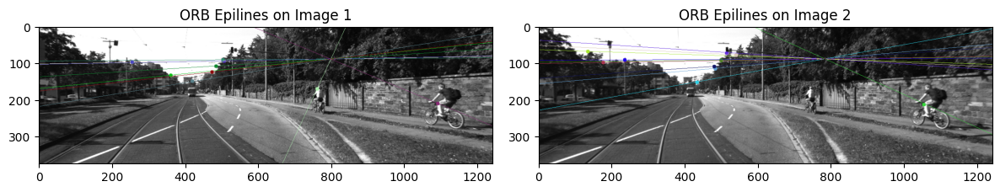

In [87]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def draw_epilines(img, lines, pts, num_lines=10):
    img_color = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
    idx = np.random.choice(len(lines), size=min(num_lines, len(lines)), replace=False)
    for i in idx:
        r = lines[i]
        pt = pts[i]
        color = tuple(np.random.randint(0, 255, 3).tolist())
        x0, y0 = map(int, [0, -r[2] / r[1]])
        x1, y1 = map(int, [img.shape[1], -(r[2] + r[0] * img.shape[1]) / r[1]])
        img_color = cv2.line(img_color, (x0, y0), (x1, y1), color, 1)
        img_color = cv2.circle(img_color, (int(pt[0]), int(pt[1])), 5, color, -1)
    return img_color

# Paths to images
img1_path = r'C:\Users\User\Documents\GitHub\pfas\helper_functions\ExamFiles2021\Exam Files\Question_18\left.png'
img2_path = r'C:\Users\User\Documents\GitHub\pfas\helper_functions\ExamFiles2021\Exam Files\Question_18\right.png'

# Load images
img1 = cv2.imread(img1_path, 0)
img2 = cv2.imread(img2_path, 0)

# Initialize ORB detector
orb = cv2.ORB_create()

# Detect and compute keypoints and descriptors
kp1, des1 = orb.detectAndCompute(img1, None)
kp2, des2 = orb.detectAndCompute(img2, None)

print("Keypoints in image 1:", len(kp1))
print("Keypoints in image 2:", len(kp2))

# Match descriptors using BFMatcher with Hamming distance
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = bf.match(des1, des2)
matches = sorted(matches, key=lambda x: x.distance)

print("Total matches:", len(matches))

# Select a subset of matches
nb_matches = min(2000, len(matches))
good_matches = matches[:nb_matches]
print("Matches used:", nb_matches)

pts1 = np.int32([kp1[m.queryIdx].pt for m in good_matches])
pts2 = np.int32([kp2[m.trainIdx].pt for m in good_matches])

# Compute fundamental matrix
F, mask = cv2.findFundamentalMat(pts1, pts2, cv2.FM_RANSAC)

inliers1 = pts1[mask.ravel() == 1]
inliers2 = pts2[mask.ravel() == 1]

print("Inliers:", len(inliers1))

# Calculate and print inlier ratio
inlier_ratio = len(inliers1) / len(matches)
print("Inlier ratio (inliers/total matches):", inlier_ratio)

# Compute epilines
lines1 = cv2.computeCorrespondEpilines(inliers2.reshape(-1, 1, 2), 2, F).reshape(-1, 3)
lines2 = cv2.computeCorrespondEpilines(inliers1.reshape(-1, 1, 2), 1, F).reshape(-1, 3)

avg1 = np.average(lines1, axis=0)
avg2 = np.average(lines2, axis=0)

# Calculate determinant of F
determinant_F = np.linalg.det(F)
print("Determinant of the Fundamental matrix (should be close to 0):", determinant_F)

print("Fundamental matrix:")
print(F)
print("Average epiline image 1:", avg1)
print("Average epiline image 2:", avg2)

# Calculate reprojection error
errors = []
for i in range(len(inliers1)):
    pt1 = np.array([*inliers1[i], 1])
    pt2 = np.array([*inliers2[i], 1])
    error = abs(np.dot(pt2.T, np.dot(F, pt1)))
    errors.append(error)
avg_reprojection_error = np.mean(errors)
print("Average reprojection error:", avg_reprojection_error)

# Match distances analysis
match_distances = [m.distance for m in good_matches]
print("Match distances statistics:")
print(f"  Min: {np.min(match_distances):.2f}")
print(f"  Max: {np.max(match_distances):.2f}")
print(f"  Mean: {np.mean(match_distances):.2f}")
print(f"  Median: {np.median(match_distances):.2f}")

# Visualization
img1_with_lines = draw_epilines(img1, lines1, inliers1, num_lines=10)
img2_with_lines = draw_epilines(img2, lines2, inliers2, num_lines=10)

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.title("ORB Epilines on Image 1")
plt.imshow(cv2.cvtColor(img1_with_lines, cv2.COLOR_BGR2RGB))

plt.subplot(1, 2, 2)
plt.title("ORB Epilines on Image 2")
plt.imshow(cv2.cvtColor(img2_with_lines, cv2.COLOR_BGR2RGB))

plt.tight_layout()
plt.show()


# Template matching

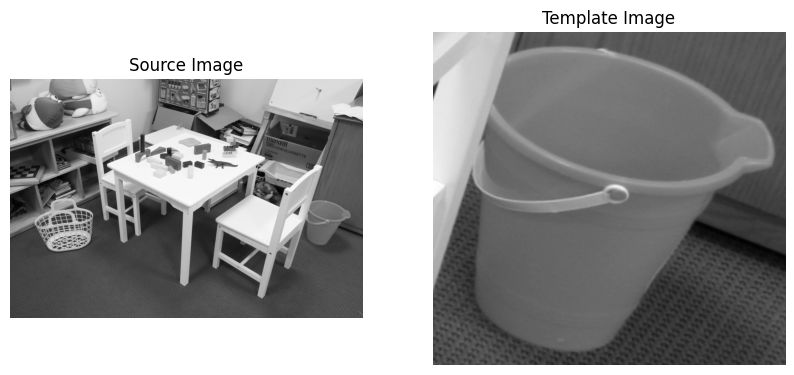


=== Method: TM_SQDIFF ===
Template size: 457 x 483
Source image size: 1848 x 2724
Similarity map range: [111099904.0 - 3688967168.0]
Best match top-left corner: (2233, 884)
Best match bottom-right corner: (2716, 1341)
Center of match: (2474, 1112)
Best match similarity value: 111099904.0


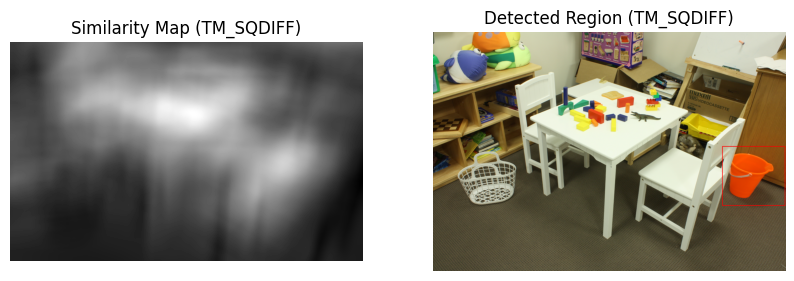


=== Method: TM_SQDIFF_NORMED ===
Template size: 457 x 483
Source image size: 1848 x 2724
Similarity map range: [0.04272043704986572 - 0.695367693901062]
Best match top-left corner: (2233, 883)
Best match bottom-right corner: (2716, 1340)
Center of match: (2474, 1111)
Best match similarity value: 0.04272043704986572


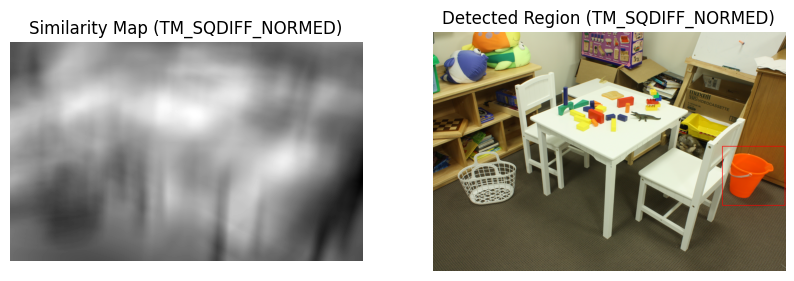


=== Method: TM_CCORR ===
Template size: 457 x 483
Source image size: 1848 x 2724
Similarity map range: [1583666176.0 - 4736763904.0]
Best match top-left corner: (1090, 436)
Best match bottom-right corner: (1573, 893)
Center of match: (1331, 664)
Best match similarity value: 4736763904.0


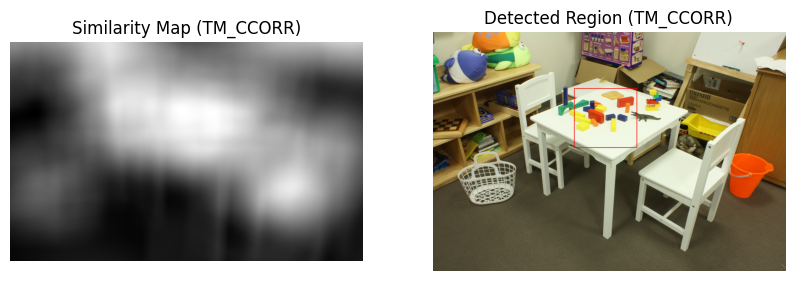


=== Method: TM_CCORR_NORMED ===
Template size: 457 x 483
Source image size: 1848 x 2724
Similarity map range: [0.7048682570457458 - 0.9796066880226135]
Best match top-left corner: (2233, 884)
Best match bottom-right corner: (2716, 1341)
Center of match: (2474, 1112)
Best match similarity value: 0.9796066880226135


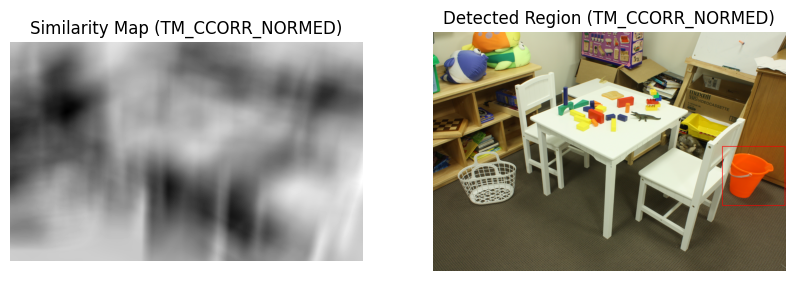


=== Method: TM_CCOEFF ===
Template size: 457 x 483
Source image size: 1848 x 2724
Similarity map range: [-283885056.0 - 369675360.0]
Best match top-left corner: (1166, 703)
Best match bottom-right corner: (1649, 1160)
Center of match: (1407, 931)
Best match similarity value: 369675360.0


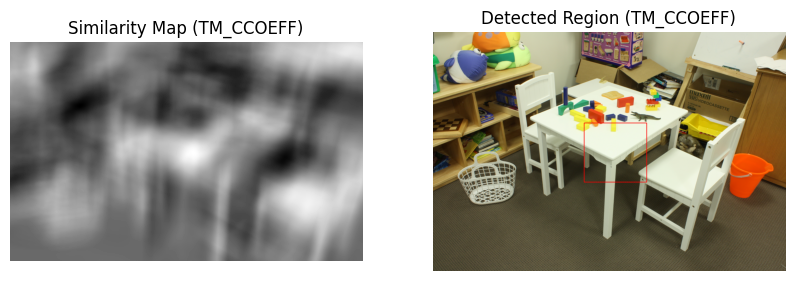


=== Method: TM_CCOEFF_NORMED ===
Template size: 457 x 483
Source image size: 1848 x 2724
Similarity map range: [-0.46242567896842957 - 0.8342742919921875]
Best match top-left corner: (2233, 884)
Best match bottom-right corner: (2716, 1341)
Center of match: (2474, 1112)
Best match similarity value: 0.8342742919921875


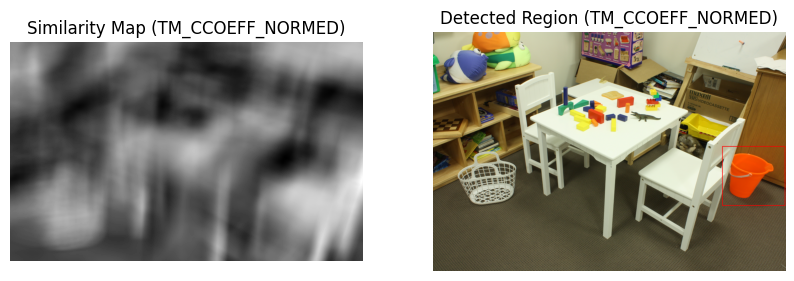

In [88]:
import cv2
from matplotlib import pyplot as plt

# Step 1: Load the source image and template image
source_image_path = r'C:\Users\User\Documents\GitHub\pfas\week3\exercises\playtable_left.png'
template_image_path = r'C:\Users\User\Documents\GitHub\pfas\week3\exercises\crocodile.png'
template_image_path = r'C:\Users\User\Documents\GitHub\pfas\week3\exercises\orange_bucket.png'

# Load source image
source_img = cv2.imread(source_image_path)
source_img_rgb = cv2.cvtColor(source_img, cv2.COLOR_BGR2RGB)
source_img_gray = cv2.cvtColor(source_img_rgb, cv2.COLOR_RGB2GRAY)

# Load template image
template_img = cv2.imread(template_image_path)
template_img_gray = cv2.cvtColor(template_img, cv2.COLOR_BGR2GRAY)

# Display images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("Source Image")
plt.imshow(source_img_gray, cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Template Image")
plt.imshow(template_img_gray, cmap='gray')
plt.axis('off')

plt.show()

# Step 2: Define the template matching methods
methods = {
    "TM_SQDIFF": cv2.TM_SQDIFF,
    "TM_SQDIFF_NORMED": cv2.TM_SQDIFF_NORMED,
    "TM_CCORR": cv2.TM_CCORR,
    "TM_CCORR_NORMED": cv2.TM_CCORR_NORMED,
    "TM_CCOEFF": cv2.TM_CCOEFF,
    "TM_CCOEFF_NORMED": cv2.TM_CCOEFF_NORMED
}

# Step 3: Perform template matching with each method
for method_name, method in methods.items():
    # Apply template matching
    res = cv2.matchTemplate(source_img_gray, template_img_gray, method)

    # Find the best match location
    if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
        top_left = min_loc  # For these methods, lower values are better
    else:
        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
        top_left = max_loc  # For these methods, higher values are better

    bottom_right = (top_left[0] + template_img_gray.shape[1], top_left[1] + template_img_gray.shape[0])

    # Print results
    print(f"\n=== Method: {method_name} ===")
    print(f"Template size: {template_img_gray.shape[0]} x {template_img_gray.shape[1]}")
    print(f"Source image size: {source_img_gray.shape[0]} x {source_img_gray.shape[1]}")
    print(f"Similarity map range: [{res.min()} - {res.max()}]")
    print(f"Best match top-left corner: {top_left}")
    print(f"Best match bottom-right corner: {bottom_right}")
    print(f"Center of match: ({(top_left[0] + bottom_right[0]) // 2}, {(top_left[1] + bottom_right[1]) // 2})")
    print(f"Best match similarity value: {res[top_left[1], top_left[0]]}")

    # Draw rectangle around the detected region
    detected_img = cv2.rectangle(source_img_rgb.copy(), top_left, bottom_right, (255, 0, 0), 3)

    # Display result
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.title(f"Similarity Map ({method_name})")
    plt.imshow(res, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title(f"Detected Region ({method_name})")
    plt.imshow(detected_img)
    plt.axis('off')

    plt.show()



# RANSAC

Laser data loaded: 541 measurements.
Sample distances: [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00] meters
Converted to Cartesian coordinates:
 - X range: -19.06 to 29.96 meters
 - Y range: -21.18 to 29.91 meters
 - Total points: 541


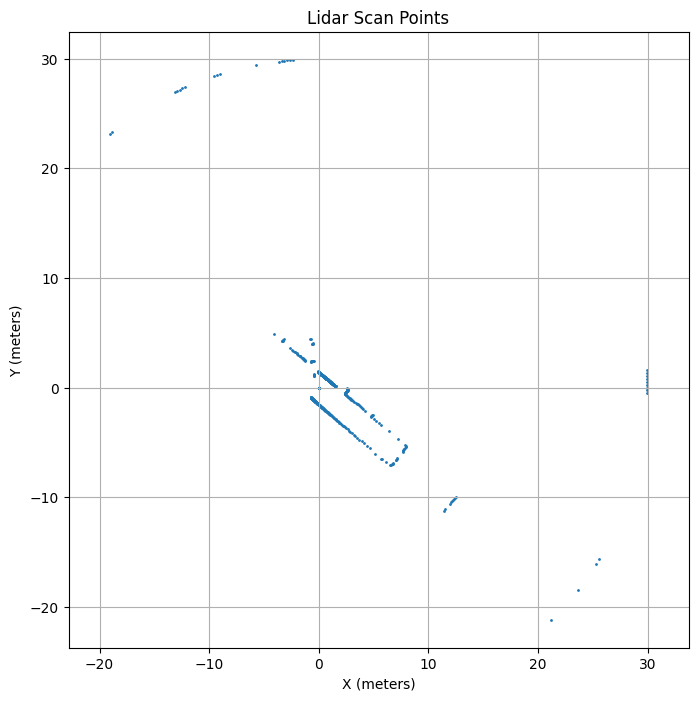


=== First Wall RANSAC Model ===
Inliers: 306 points
Outliers: 235 points
Line equation: y = -0.86x + 1.44


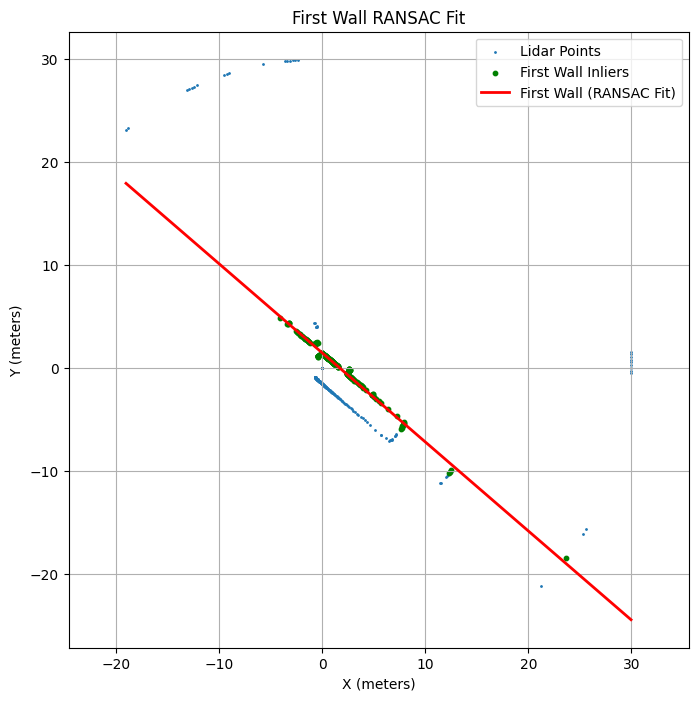


=== Second Wall RANSAC Model ===
Inliers: 172 points
Outliers: 63 points
Line equation: y = -0.84x + -1.57
Average Distance of Inliers from First Wall: 0.10 meters
Average Distance of Inliers from Second Wall: 1.21 meters
Angle Between the Two Walls: 0.68 degrees
Percentage of Inliers for First Wall: 56.56%
Percentage of Inliers for Second Wall: 73.19%
First Wall Inliers - Mean X: 1.28, Std X: 2.61
First Wall Inliers - Mean Y: 0.33, Std Y: 2.27
Second Wall Inliers - Mean X: 0.85, Std X: 2.07
Second Wall Inliers - Mean Y: -2.28, Std Y: 1.75


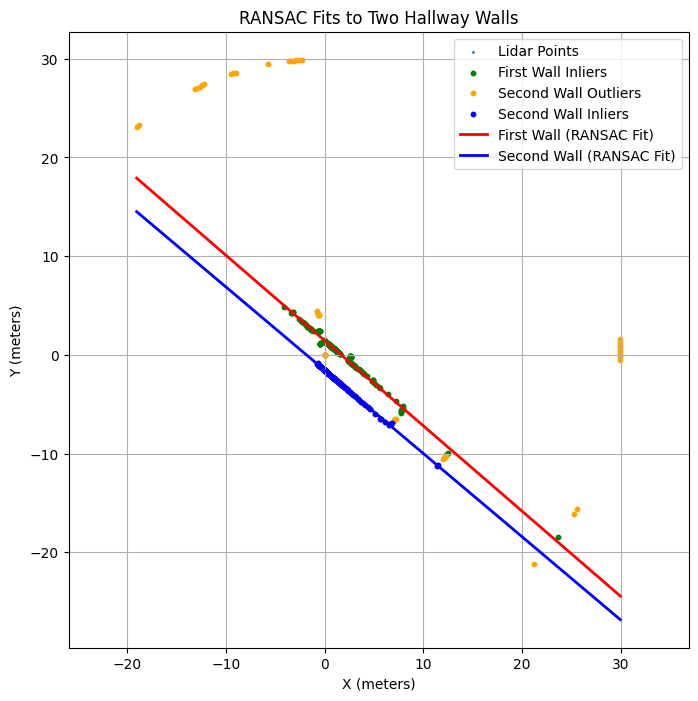

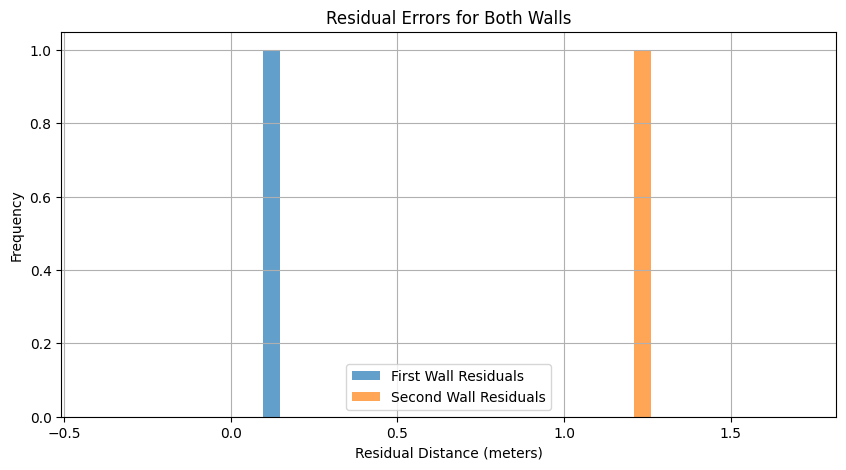

In [89]:
import numpy as np
from matplotlib import pyplot as plt
from sklearn import linear_model

# Step 1: Load LiDAR Data
laser_file = r'C:\Users\User\Documents\GitHub\pfas\week4\exercises\laser.csv'
laser = np.genfromtxt(laser_file, delimiter=',')

# Verify data import
print(f"Laser data loaded: {len(laser)} measurements.")
print(f"Sample distances: {laser[:5]} meters")

# Step 2: Convert Polar Coordinates to Cartesian Coordinates
angles = np.linspace(np.deg2rad(135), np.deg2rad(-135), len(laser))
x = laser * np.cos(angles)
y = laser * np.sin(angles)

print(f"Converted to Cartesian coordinates:")
print(f" - X range: {x.min():.2f} to {x.max():.2f} meters")
print(f" - Y range: {y.min():.2f} to {y.max():.2f} meters")
print(f" - Total points: {len(x)}")

# Step 3: Plot the LiDAR Points
plt.figure(figsize=(8, 8))
plt.scatter(x, y, s=1)
plt.xlabel('X (meters)')
plt.ylabel('Y (meters)')
plt.title('Lidar Scan Points')
plt.grid(True)
plt.axis('equal')
plt.show()

# Step 4: Fit the First Wall Using RANSAC
ransac = linear_model.RANSACRegressor()
X = x.reshape(-1, 1)
ransac.fit(X, y)

inlier_mask = ransac.inlier_mask_
outlier_mask = ~ransac.inlier_mask_

slope1, intercept1 = ransac.estimator_.coef_[0], ransac.estimator_.intercept_
print("\n=== First Wall RANSAC Model ===")
print(f"Inliers: {np.sum(inlier_mask)} points")
print(f"Outliers: {np.sum(outlier_mask)} points")
print(f"Line equation: y = {slope1:.2f}x + {intercept1:.2f}")

line_x = np.linspace(X.min(), X.max(), 500)
line_y_ransac = ransac.predict(line_x.reshape(-1, 1))

# Step 5: Plot the First Wall Fit
plt.figure(figsize=(8, 8))
plt.scatter(x, y, s=1, label='Lidar Points')
plt.scatter(x[inlier_mask], y[inlier_mask], color='green', s=10, label='First Wall Inliers')
plt.plot(line_x, line_y_ransac, color='red', linewidth=2, label='First Wall (RANSAC Fit)')
plt.xlabel('X (meters)')
plt.ylabel('Y (meters)')
plt.title('First Wall RANSAC Fit')
plt.legend()
plt.grid(True)
plt.axis('equal')
plt.show()

# Step 6: Fit the Second Wall Using RANSAC
ransac2 = linear_model.RANSACRegressor()
X_outliers = x[outlier_mask].reshape(-1, 1)
y_outliers = y[outlier_mask]
ransac2.fit(X_outliers, y_outliers)

slope2, intercept2 = ransac2.estimator_.coef_[0], ransac2.estimator_.intercept_
print("\n=== Second Wall RANSAC Model ===")
print(f"Inliers: {np.sum(ransac2.inlier_mask_)} points")
print(f"Outliers: {np.sum(~ransac2.inlier_mask_)} points")
print(f"Line equation: y = {slope2:.2f}x + {intercept2:.2f}")

line_x2 = np.linspace(X_outliers.min(), X_outliers.max(), 500)
line_y_ransac2 = ransac2.predict(line_x2.reshape(-1, 1))

# Step 7: Calculate Additional Metrics
def calculate_average_distance(x_points, y_points, slope, intercept):
    distances = np.abs(y_points - (slope * x_points + intercept)) / np.sqrt(1 + slope ** 2)
    return np.mean(distances)

avg_distance1 = calculate_average_distance(x[inlier_mask], y[inlier_mask], slope1, intercept1)
avg_distance2 = calculate_average_distance(
    X_outliers[ransac2.inlier_mask_], y_outliers[ransac2.inlier_mask_], slope2, intercept2
)
print(f"Average Distance of Inliers from First Wall: {avg_distance1:.2f} meters")
print(f"Average Distance of Inliers from Second Wall: {avg_distance2:.2f} meters")

angle_between_walls = np.rad2deg(np.arctan(np.abs((slope2 - slope1) / (1 + slope1 * slope2))))
print(f"Angle Between the Two Walls: {angle_between_walls:.2f} degrees")

percentage_inliers1 = np.sum(inlier_mask) / len(inlier_mask) * 100
percentage_inliers2 = np.sum(ransac2.inlier_mask_) / len(ransac2.inlier_mask_) * 100
print(f"Percentage of Inliers for First Wall: {percentage_inliers1:.2f}%")
print(f"Percentage of Inliers for Second Wall: {percentage_inliers2:.2f}%")

mean_x1, std_x1 = np.mean(x[inlier_mask]), np.std(x[inlier_mask])
mean_y1, std_y1 = np.mean(y[inlier_mask]), np.std(y[inlier_mask])
mean_x2, std_x2 = np.mean(X_outliers[ransac2.inlier_mask_]), np.std(X_outliers[ransac2.inlier_mask_])
mean_y2, std_y2 = np.mean(y_outliers[ransac2.inlier_mask_]), np.std(y_outliers[ransac2.inlier_mask_])

print(f"First Wall Inliers - Mean X: {mean_x1:.2f}, Std X: {std_x1:.2f}")
print(f"First Wall Inliers - Mean Y: {mean_y1:.2f}, Std Y: {std_y1:.2f}")
print(f"Second Wall Inliers - Mean X: {mean_x2:.2f}, Std X: {std_x2:.2f}")
print(f"Second Wall Inliers - Mean Y: {mean_y2:.2f}, Std Y: {std_y2:.2f}")

# Step 8: Plot Both Walls and All Data Points
plt.figure(figsize=(8, 8))
plt.scatter(x, y, s=1, label='Lidar Points')
plt.scatter(x[inlier_mask], y[inlier_mask], color='green', s=10, label='First Wall Inliers')
plt.scatter(x[outlier_mask], y[outlier_mask], color='orange', s=10, label='Second Wall Outliers')
plt.scatter(
    X_outliers[ransac2.inlier_mask_], y_outliers[ransac2.inlier_mask_],
    color='blue', s=10, label='Second Wall Inliers'
)
plt.plot(line_x, line_y_ransac, color='red', linewidth=2, label='First Wall (RANSAC Fit)')
plt.plot(line_x2, line_y_ransac2, color='blue', linewidth=2, label='Second Wall (RANSAC Fit)')
plt.xlabel('X (meters)')
plt.ylabel('Y (meters)')
plt.title('RANSAC Fits to Two Hallway Walls')
plt.legend()
plt.grid(True)
plt.axis('equal')
plt.show()

# Step 9: Plot Residual Errors
distances1 = calculate_average_distance(x[inlier_mask], y[inlier_mask], slope1, intercept1)
distances2 = calculate_average_distance(
    X_outliers[ransac2.inlier_mask_], y_outliers[ransac2.inlier_mask_], slope2, intercept2
)

plt.figure(figsize=(10, 5))
plt.hist(distances1, bins=20, alpha=0.7, label='First Wall Residuals')
plt.hist(distances2, bins=20, alpha=0.7, label='Second Wall Residuals')
plt.xlabel('Residual Distance (meters)')
plt.ylabel('Frequency')
plt.title('Residual Errors for Both Walls')
plt.legend()
plt.grid(True)
plt.show()


## Number of iterations of RANSAC

In [90]:
import math

p = 0.98
w = 0.75

k = (math.log(1-p))/(math.log(1-(w**2)))

print(k)

4.732217735314645


## Global Registration with RANSAC

Loaded point clouds:
 - Source points: 198835
 - Target points: 191397
Downsampled point clouds with voxel size 0.05:
 - Source points after downsampling: 4760
 - Target points after downsampling: 4517
Normals estimated with radius 0.1 and max_nn 30.
Computed FPFH features with radius 0.1.


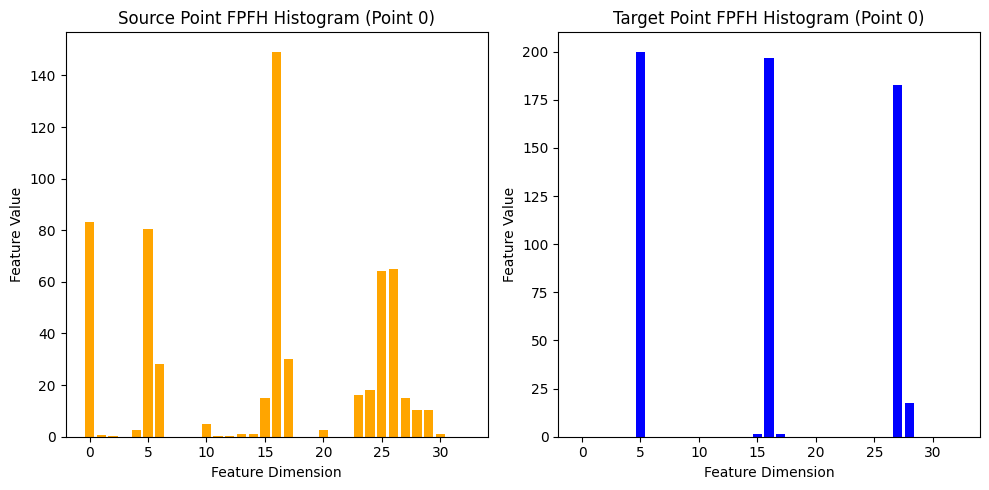

Using Point-to-Point Registration
RANSAC Registration Results:
 - Fitness: 0.7546218487394958
 - Inlier RMSE: 0.02894620498802945
 - Transformation Matrix:
[[-2.641e-01 9.645e-01 -7.523e-03 3.265e-03]
 [-2.891e-01 -7.171e-02 9.546e-01 8.850e-01]
 [9.202e-01 2.542e-01 2.978e-01 -1.173e+00]
 [0.000e+00 0.000e+00 0.000e+00 1.000e+00]]


In [91]:
import open3d as o3d
import numpy as np
import matplotlib.pyplot as plt
import copy

# Utility function to draw point clouds with optional transformation and recoloring
def draw_registrations(source, target, transformation=None, recolor=False):
    source_temp = copy.deepcopy(source)
    target_temp = copy.deepcopy(target)
    if recolor:
        source_temp.paint_uniform_color([1.0, 0.0, 0.0])  # Red
        target_temp.paint_uniform_color([0.0, 1.0, 0.0])  # Green
    if transformation is not None:
        source_temp.transform(transformation)
    o3d.visualization.draw_geometries([source_temp, target_temp], window_name="Point Cloud Registration")

# Parameters for processing
voxel_size = 0.05
radius_normal = 0.1
radius_fpfh = 0.1
max_nn = 30

# Step 1: Load Point Clouds for r1 and r3
source = o3d.io.read_point_cloud(r'C:\Users\User\Documents\GitHub\pfas\week5\ICP\r1.pcd')
target = o3d.io.read_point_cloud(r'C:\Users\User\Documents\GitHub\pfas\week5\ICP\r3.pcd')
print("Loaded point clouds:")
print(f" - Source points: {len(source.points)}")
print(f" - Target points: {len(target.points)}")

# Visualize the original point clouds
draw_registrations(source, target, recolor=True)

# Step 2: Downsample the Point Clouds
source_down = source.voxel_down_sample(voxel_size)
target_down = target.voxel_down_sample(voxel_size)
print(f"Downsampled point clouds with voxel size {voxel_size}:")
print(f" - Source points after downsampling: {len(source_down.points)}")
print(f" - Target points after downsampling: {len(target_down.points)}")

# Estimate normals for downsampled point clouds
source_down.estimate_normals(o3d.geometry.KDTreeSearchParamHybrid(radius=radius_normal, max_nn=max_nn))
target_down.estimate_normals(o3d.geometry.KDTreeSearchParamHybrid(radius=radius_normal, max_nn=max_nn))
print(f"Normals estimated with radius {radius_normal} and max_nn {max_nn}.")

# Visualize downsampled point clouds
draw_registrations(source_down, target_down, recolor=True)

# Step 3: Compute FPFH Features
source_fpfh = o3d.pipelines.registration.compute_fpfh_feature(
    source_down, o3d.geometry.KDTreeSearchParamHybrid(radius=radius_fpfh, max_nn=100))
target_fpfh = o3d.pipelines.registration.compute_fpfh_feature(
    target_down, o3d.geometry.KDTreeSearchParamHybrid(radius=radius_fpfh, max_nn=100))
print(f"Computed FPFH features with radius {radius_fpfh}.")

# Step 4: Visualize FPFH Features
index = 0  # Select a specific point to visualize FPFH
source_fpfh_hist = source_fpfh.data[:, index]
target_fpfh_hist = target_fpfh.data[:, index]

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.bar(range(len(source_fpfh_hist)), source_fpfh_hist, color='orange')
plt.title(f"Source Point FPFH Histogram (Point {index})")
plt.xlabel("Feature Dimension")
plt.ylabel("Feature Value")

plt.subplot(1, 2, 2)
plt.bar(range(len(target_fpfh_hist)), target_fpfh_hist, color='blue')
plt.title(f"Target Point FPFH Histogram (Point {index})")
plt.xlabel("Feature Dimension")
plt.ylabel("Feature Value")

plt.tight_layout()
plt.show()

# Step 5: RANSAC Registration Function
def run_ransac_registration(source_down, target_down, source_fpfh, target_fpfh, method="point-to-point"):
    # Define RANSAC parameters
    corr_length = 0.9
    distance_threshold = voxel_size * 1.5
    c0 = o3d.pipelines.registration.CorrespondenceCheckerBasedOnEdgeLength(corr_length)
    c1 = o3d.pipelines.registration.CorrespondenceCheckerBasedOnDistance(distance_threshold)
    c2 = o3d.pipelines.registration.CorrespondenceCheckerBasedOnNormal(0.095)

    checker_list = [c0, c1, c2]
    if method == "point-to-point":
        estimation_method = o3d.pipelines.registration.TransformationEstimationPointToPoint(False)
        print("Using Point-to-Point Registration")
    elif method == "point-to-plane":
        estimation_method = o3d.pipelines.registration.TransformationEstimationPointToPlane()
        print("Using Point-to-Plane Registration")
    else:
        raise ValueError("Invalid method! Choose either 'point-to-point' or 'point-to-plane'.")

    # Perform RANSAC registration
    ransac_result = o3d.pipelines.registration.registration_ransac_based_on_feature_matching(
        source_down, target_down, source_fpfh, target_fpfh, True,
        distance_threshold, estimation_method, 4, checker_list,
        o3d.pipelines.registration.RANSACConvergenceCriteria(4000000, 500))
    print("RANSAC Registration Results:")
    print(f" - Fitness: {ransac_result.fitness}")
    print(f" - Inlier RMSE: {ransac_result.inlier_rmse}")
    print(" - Transformation Matrix:")
    print(ransac_result.transformation)
    return ransac_result

# Step 6: Run RANSAC Registration
chosen_method = "point-to-point"  # Choose "point-to-point" or "point-to-plane"
ransac_result = run_ransac_registration(source_down, target_down, source_fpfh, target_fpfh, method=chosen_method)

# Step 7: Visualize RANSAC Registration Results
draw_registrations(source, target, ransac_result.transformation, recolor=True)

# Step 8: Additional Exercises
# Try tweaking parameters (e.g., voxel_size, radius_normal, etc.) to improve results.


# K-Means and PCA

## K-means

File read successfully.
Calculating distortions for different numbers of clusters...


c:\Users\User\Documents\GitHub\pfas\week5\pfas2\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\User\Documents\GitHub\pfas\week5\pfas2\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\User\Documents\GitHub\pfas\week5\pfas2\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\User\Documents\GitHub\pfas\week5\pfas2\Lib\site-packages\s

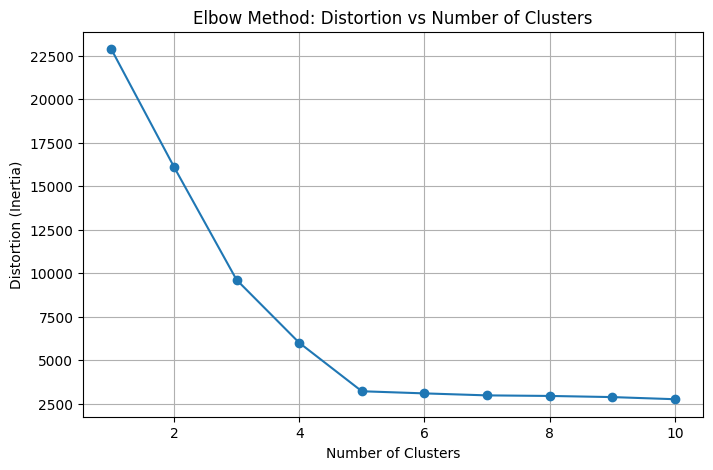

In [92]:
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Step 1: Read the data file
file_path = r'C:\Users\User\Documents\GitHub\pfas\helper_functions\ExamFiles2021\Exam Files\Question_23\clusters.txt'
file_pacth = r'C:\Users\User\Documents\GitHub\pfas\helper_functions\data.txt'

try:
    # Load the file as a NumPy array
    data = np.loadtxt(file_path)
    print("File read successfully.")
except Exception as e:
    print(f"Error reading file: {e}")
    exit()

# Step 2: Validate the data
if data.size == 0:
    print("The file is empty or contains invalid data.")
    exit()

# Step 3: Apply K-Means clustering and calculate distortions
distortions = []
max_clusters = 10  # Maximum number of clusters to test
cluster_range = range(1, max_clusters + 1)

print("Calculating distortions for different numbers of clusters...")
for k in cluster_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(data)
    distortions.append(kmeans.inertia_)

# Step 4: Plot the elbow method
plt.figure(figsize=(8, 5))
plt.plot(cluster_range, distortions, marker='o')
plt.title('Elbow Method: Distortion vs Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Distortion (Inertia)')
plt.grid(True)
plt.show()


## PCA

File read successfully.
Performing PCA on the dataset...

Explained Variance by Each Principal Component:
Principal Component 1: 0.3954
Principal Component 2: 0.2777
Principal Component 3: 0.1624
Principal Component 4: 0.0803
Principal Component 5: 0.0207
Principal Component 6: 0.0182
Principal Component 7: 0.0155
Principal Component 8: 0.0118
Principal Component 9: 0.0100
Principal Component 10: 0.0079

Cumulative Explained Variance:
Up to Principal Component 1: 0.3954
Up to Principal Component 2: 0.6731
Up to Principal Component 3: 0.8356
Up to Principal Component 4: 0.9159
Up to Principal Component 5: 0.9366
Up to Principal Component 6: 0.9548
Up to Principal Component 7: 0.9703
Up to Principal Component 8: 0.9821
Up to Principal Component 9: 0.9921
Up to Principal Component 10: 1.0000


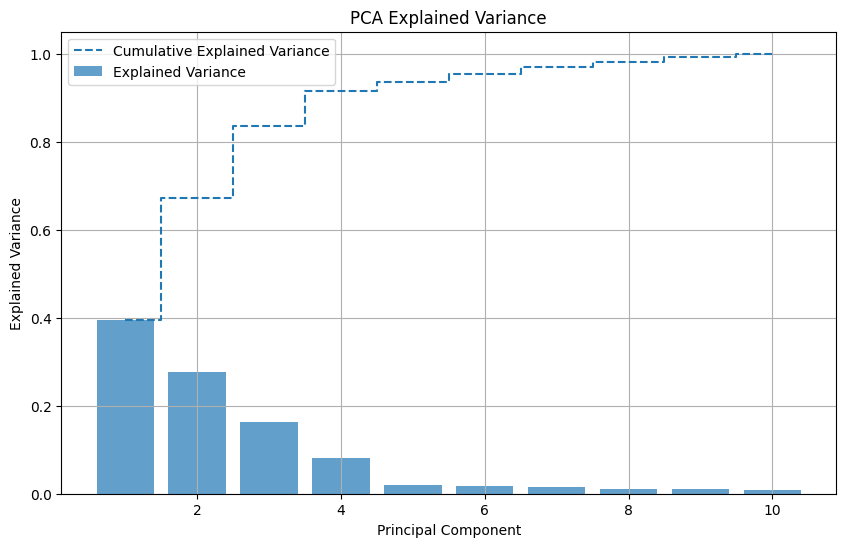

In [93]:
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Step 1: Read the data file
file_path = r'C:\Users\User\Documents\GitHub\pfas\helper_functions\ExamFiles2021\Exam Files\Question_23\clusters.txt'

try:
    # Load the file as a NumPy array
    data = np.loadtxt(file_path)
    print("File read successfully.")
except Exception as e:
    print(f"Error reading file: {e}")
    exit()

# Step 2: Validate the data
if data.size == 0:
    print("The file is empty or contains invalid data.")
    exit()

# Step 3: Perform PCA
print("Performing PCA on the dataset...")
pca = PCA()
pca.fit(data)

# Explained variance
explained_variance = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance)


# Print numerical results
print("\nExplained Variance by Each Principal Component:")
for i, var in enumerate(explained_variance, start=1):
    print(f"Principal Component {i}: {var:.4f}")

print("\nCumulative Explained Variance:")
for i, cum_var in enumerate(cumulative_variance, start=1):
    print(f"Up to Principal Component {i}: {cum_var:.4f}")


# Step 4: Plot explained variance and cumulative variance
plt.figure(figsize=(10, 6))

# Plot individual explained variance
plt.bar(range(1, len(explained_variance) + 1), explained_variance, alpha=0.7, label='Explained Variance')

# Plot cumulative explained variance
plt.step(range(1, len(cumulative_variance) + 1), cumulative_variance, where='mid', label='Cumulative Explained Variance', linestyle='--')

plt.xlabel('Principal Component')
plt.ylabel('Explained Variance')
plt.title('PCA Explained Variance')
plt.legend(loc='best')
plt.grid(True)
plt.show()


## PCA and K-Means

File read successfully.
Performing PCA on the dataset...

Applying K-Means with k = 5 on the PCA-transformed data...
Distortion/Inertia (Sum of squared distances to closest centroid): 3223.8500


c:\Users\User\Documents\GitHub\pfas\week5\pfas2\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


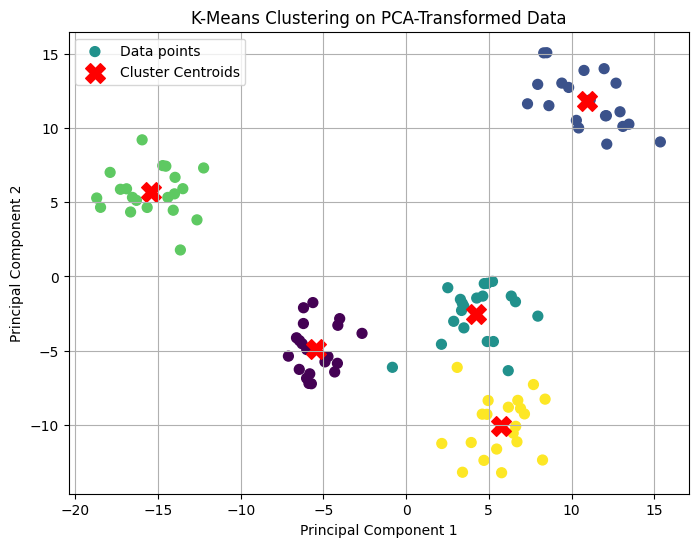

In [94]:
import numpy as np
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Step 1: Read the data file
file_path = r'C:\Users\User\Documents\GitHub\pfas\helper_functions\ExamFiles2021\Exam Files\Question_23\clusters.txt'

try:
    # Load the file as a NumPy array
    data = np.loadtxt(file_path)
    print("File read successfully.")
except Exception as e:
    print(f"Error reading file: {e}")
    exit()

# Step 2: Validate the data
if data.size == 0:
    print("The file is empty or contains invalid data.")
    exit()

# Step 3: Perform PCA
print("Performing PCA on the dataset...")
pca = PCA()
pca_transformed = pca.fit_transform(data)

# Step 4: Perform K-Means clustering on the PCA-transformed data
k = 5  # Number of clusters
print(f"\nApplying K-Means with k = {k} on the PCA-transformed data...")
kmeans = KMeans(n_clusters=k, random_state=42)
kmeans.fit(pca_transformed)

# Calculate distortion (inertia)
distortion = kmeans.inertia_
print(f"Distortion/Inertia (Sum of squared distances to closest centroid): {distortion:.4f}")

# Step 5: Plot the PCA-transformed data with K-Means cluster labels
plt.figure(figsize=(8, 6))
plt.scatter(
    pca_transformed[:, 0], 
    pca_transformed[:, 1], 
    c=kmeans.labels_, 
    cmap='viridis', 
    s=50, 
    label='Data points'
)
plt.scatter(
    kmeans.cluster_centers_[:, 0], 
    kmeans.cluster_centers_[:, 1], 
    c='red', 
    marker='X', 
    s=200, 
    label='Cluster Centroids'
)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('K-Means Clustering on PCA-Transformed Data')
plt.legend()
plt.grid(True)
plt.show()


# Regression

## Linear regression

Files read successfully.

Training Linear Regression model...

Linear Regression Model Details:
Intercept: 19.8563
Coefficient: 0.5459

Model Evaluation:
Mean Squared Error (MSE): 4.2287
R-squared (R2 Score): 0.6415


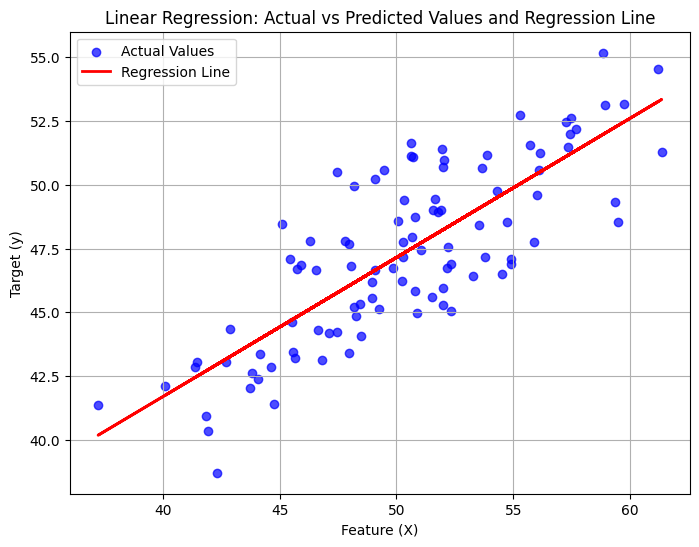

In [95]:
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Step 1: Read the data files
x_file_path = r'C:\Users\User\Documents\GitHub\pfas\helper_functions\ExamFiles2021\Exam Files\Question_24\lr_x.txt'
y_file_path = r'C:\Users\User\Documents\GitHub\pfas\helper_functions\ExamFiles2021\Exam Files\Question_24\lr_y.txt'

try:
    # Load the X and y files as NumPy arrays
    X = np.loadtxt(x_file_path).reshape(-1, 1)  # Ensure X is 2D for sklearn
    y = np.loadtxt(y_file_path)
    print("Files read successfully.")
except Exception as e:
    print(f"Error reading files: {e}")
    exit()

# Step 2: Validate the data
if X.size == 0 or y.size == 0:
    print("One or both files are empty or contain invalid data.")
    exit()

if len(X) != len(y):
    print("The number of rows in X and y do not match.")
    exit()

# Step 3: Apply Linear Regression
print("\nTraining Linear Regression model...")
model = LinearRegression()
model.fit(X, y)

# Step 4: Print model details
print("\nLinear Regression Model Details:")
print(f"Intercept: {model.intercept_:.4f}")
print(f"Coefficient: {model.coef_[0]:.4f}")

# Step 5: Evaluate the model
y_pred = model.predict(X)
mse = mean_squared_error(y, y_pred)
r2 = r2_score(y, y_pred)

print("\nModel Evaluation:")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"R-squared (R2 Score): {r2:.4f}")

# Step 6: Plot Actual vs Predicted values and the regression line
plt.figure(figsize=(8, 6))
plt.scatter(X, y, color='blue', alpha=0.7, label='Actual Values')
plt.plot(X, y_pred, color='red', label='Regression Line', linewidth=2)
plt.xlabel('Feature (X)')
plt.ylabel('Target (y)')
plt.title('Linear Regression: Actual vs Predicted Values and Regression Line')
plt.legend()
plt.grid(True)
plt.show()


## Linar regression - Plane

Point Cloud Loaded: 500 points
Point Cloud Bounds:
 - X: min=-4.232, max=12.265
 - Y: min=-4.255, max=11.173
 - Z: min=5.687, max=28.559


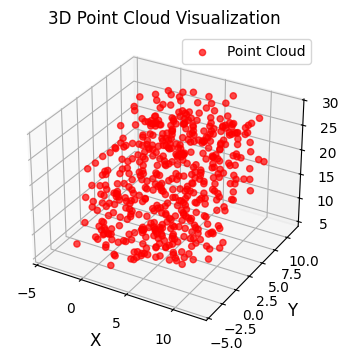


=== Linear Regression Results ===
Intercept (β_0): 10.814
Coefficients (β_1, β_2): 0.032, 1.527

=== Model Evaluation Metrics ===
Residual Sum of Squares (RSS): 1276.146
Mean Squared Error (MSE): 2.552
R-squared (R²): 0.916


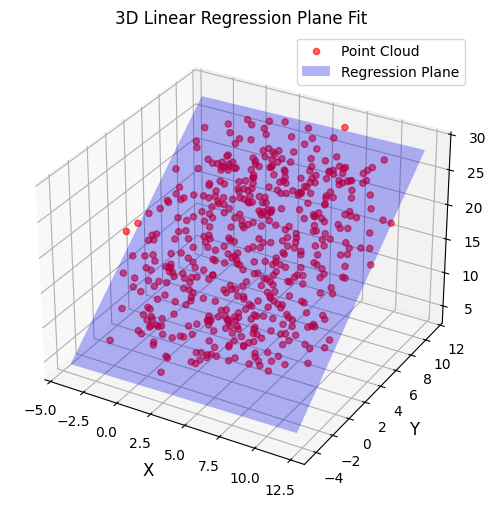

In [96]:
import numpy as np
import open3d as o3d
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

# Step 1: Load and visualize the point cloud
pc = o3d.io.read_point_cloud(r'C:\Users\User\Documents\GitHub\pfas\week6\exercises\TestData\spread_points.ply')
xyz = np.asarray(pc.points)

# Print basic information about the point cloud
print(f"Point Cloud Loaded: {len(xyz)} points")
print(f"Point Cloud Bounds:")
print(f" - X: min={np.min(xyz[:, 0]):.3f}, max={np.max(xyz[:, 0]):.3f}")
print(f" - Y: min={np.min(xyz[:, 1]):.3f}, max={np.max(xyz[:, 1]):.3f}")
print(f" - Z: min={np.min(xyz[:, 2]):.3f}, max={np.max(xyz[:, 2]):.3f}")

fig = plt.figure(figsize=(6, 4))
ax = plt.axes(projection='3d')
ax.scatter3D(xyz[:, 0], xyz[:, 1], xyz[:, 2], color='red', alpha=0.7, label="Point Cloud")
ax.set_xlabel('X', fontsize=12)
ax.set_ylabel('Y', fontsize=12)
ax.set_zlabel('Z', fontsize=12)
plt.legend()
plt.title("3D Point Cloud Visualization")
plt.show()

# Step 2: Prepare the data for linear regression
# We want to predict z from x and y, so x and y are features and z is target
X = xyz[:, :2]  # x and y as features
Z = xyz[:, 2].reshape(-1, 1)  # z as target

# Step 3: Fit the Linear Regression model
lm_3d = LinearRegression()
lm_3d.fit(X, Z)

# Extract and print the regression details
intercept_3d = lm_3d.intercept_[0]
coefficients_3d = lm_3d.coef_[0]
print("\n=== Linear Regression Results ===")
print(f"Intercept (β_0): {intercept_3d:.3f}")
print(f"Coefficients (β_1, β_2): {coefficients_3d[0]:.3f}, {coefficients_3d[1]:.3f}")

# Model evaluation metrics
z_pred = lm_3d.predict(X)
rss = np.sum((Z - z_pred) ** 2)  # Residual Sum of Squares
tss = np.sum((Z - np.mean(Z)) ** 2)  # Total Sum of Squares
r_squared = 1 - (rss / tss)  # R-squared
mse = np.mean((Z - z_pred) ** 2)  # Mean Squared Error

print("\n=== Model Evaluation Metrics ===")
print(f"Residual Sum of Squares (RSS): {rss:.3f}")
print(f"Mean Squared Error (MSE): {mse:.3f}")
print(f"R-squared (R²): {r_squared:.3f}")

# Step 4: Create a meshgrid for plane visualization
x_t = np.linspace(np.min(X[:, 0]), np.max(X[:, 0]), 50)
y_t = np.linspace(np.min(X[:, 1]), np.max(X[:, 1]), 50)
xx, yy = np.meshgrid(x_t, y_t)

# Calculate the corresponding z values for the plane
predicted_zz = intercept_3d + coefficients_3d[0] * xx + coefficients_3d[1] * yy

# Step 5: Plot the plane with the original point cloud
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter3D(xyz[:, 0], xyz[:, 1], xyz[:, 2], color='red', alpha=0.6, label="Point Cloud")
ax.plot_surface(xx, yy, predicted_zz, alpha=0.3, color='blue', label="Regression Plane")
ax.set_xlabel('X', fontsize=12)
ax.set_ylabel('Y', fontsize=12)
ax.set_zlabel('Z', fontsize=12)
plt.title("3D Linear Regression Plane Fit")
plt.legend()
plt.show()


# Kalman Filter

In [97]:
import numpy as np

# Initial state vector (position and velocity in x and y directions)
x = 3
vx = 0.5
y = 2
vy = 0.33

state = np.array([x, vx, y, vy]).reshape(-1, 1)  # Reshape to column vector for matrix operations

# Initial covariance matrix
covariance = np.array([
    [5, 1, 0, 0],
    [1, 2, 0, 0],
    [0, 0, 5, 1],
    [0, 0, 1, 2]
])

# External forces and noise
u = np.zeros((4, 1))  # No external forces
Q = np.zeros((4, 4))  # Process noise

# Time step
dt = 1

# State transition matrix (F)
F = np.array([
    [1, dt, 0,  0],
    [0,  1, 0,  0],
    [0,  0, 1, dt],
    [0,  0, 0,  1]
])

# Measurement matrix (H) - Maps state space to measurement space (only x and y)
H = np.array([
    [1, 0, 0, 0],
    [0, 0, 1, 0]
])

""" # Prediction step (state and covariance)
predicted_state = F @ state + u
predicted_covariance = F @ covariance @ F.T + Q """

# Manual predicted state and covariance
predicted_state = np.array([5, 0.5, 7, 0.8]).reshape(-1, 1)
predicted_covariance = np.array([
    [0.2, 0, 0, 0],
    [0.2, 0.1, 0, 0],
    [0, 0, 0.2, 0],
    [0, 0, 0.2, 0.1]
])

# Simulated measurement (only x and y positions)
measurement = np.array([4.8, 7.1]).reshape(-1, 1)  # Adjusted to include only x and y

# Observation/measurement noise (R)
R = np.array([
    [0.2, 0.2],
    [0.2, 0.2]
])

# Update step
y_tilde = measurement - H @ predicted_state  # Measurement residual
S = H @ predicted_covariance @ H.T + R      # Residual covariance
K = predicted_covariance @ H.T @ np.linalg.inv(S)  # Kalman Gain
updated_state = predicted_state + K @ y_tilde     # Updated state
updated_covariance = (np.eye(4) - K @ H) @ predicted_covariance  # Updated covariance

# Printing the steps
print("Initial State:")
print(state)

print("\nState Transition Matrix (F):")
print(F)

print("\nPredicted State (x'):")  # Predicted state
print(predicted_state)

print("\nPredicted Covariance (P'):")  # Predicted covariance
print(predicted_covariance)

print("\nMeasurement:")  # Measurement
print(measurement)

print("\nMeasurement Residual (y_tilde):")  # Residual between measurement and prediction
print(y_tilde)

print("\nResidual Covariance (S):")  # Covariance of the residual
print(S)

print("\nKalman Gain (K):")  # Kalman gain
print(K)

print("\nUpdated State (x):")  # Updated state
print(updated_state)

print("\nUpdated Covariance (P):")  # Updated covariance
print(updated_covariance)


Initial State:
[[3.000e+00]
 [5.000e-01]
 [2.000e+00]
 [3.300e-01]]

State Transition Matrix (F):
[[1 1 0 0]
 [0 1 0 0]
 [0 0 1 1]
 [0 0 0 1]]

Predicted State (x'):
[[5.000e+00]
 [5.000e-01]
 [7.000e+00]
 [8.000e-01]]

Predicted Covariance (P'):
[[2.000e-01 0.000e+00 0.000e+00 0.000e+00]
 [2.000e-01 1.000e-01 0.000e+00 0.000e+00]
 [0.000e+00 0.000e+00 2.000e-01 0.000e+00]
 [0.000e+00 0.000e+00 2.000e-01 1.000e-01]]

Measurement:
[[4.800e+00]
 [7.100e+00]]

Measurement Residual (y_tilde):
[[-2.000e-01]
 [1.000e-01]]

Residual Covariance (S):
[[4.000e-01 2.000e-01]
 [2.000e-01 4.000e-01]]

Kalman Gain (K):
[[6.667e-01 -3.333e-01]
 [6.667e-01 -3.333e-01]
 [-3.333e-01 6.667e-01]
 [-3.333e-01 6.667e-01]]

Updated State (x):
[[4.833e+00]
 [3.333e-01]
 [7.133e+00]
 [9.333e-01]]

Updated Covariance (P):
[[6.667e-02 0.000e+00 6.667e-02 0.000e+00]
 [6.667e-02 1.000e-01 6.667e-02 0.000e+00]
 [6.667e-02 0.000e+00 6.667e-02 0.000e+00]
 [6.667e-02 0.000e+00 6.667e-02 1.000e-01]]


# Stereo Visual Odometry

In [98]:
import numpy as np
import cv2
import glob

def extract_keypoints_sift(img1, img2, K, baseline):
    """
    Extract keypoints from two images using SIFT, match them, and triangulate 3D points.

    Parameters:
        img1: Left grayscale image.
        img2: Right grayscale image.
        K: Camera intrinsic matrix.
        baseline: Distance between the two cameras (in meters).

    Returns:
        land_points: Triangulated 3D points in the world coordinate frame.
        p1: 2D points (keypoints) in the first image.
    """
    # Create SIFT object for feature detection and description
    sift = cv2.SIFT_create()

    # Detect keypoints and compute descriptors for both images
    kp1, des1 = sift.detectAndCompute(img1, None)  # Keypoints and descriptors for image 1
    kp2, des2 = sift.detectAndCompute(img2, None)  # Keypoints and descriptors for image 2

    # Create a Brute Force Matcher with L2 norm
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)

    # Match descriptors between the two images using KNN matching (find two nearest neighbors)
    matches = bf.knnMatch(des1, des2, k=2)

    # Apply Lowe's ratio test to filter out bad matches
    match_points1 = []  # Stores good matches' points from image 1
    match_points2 = []  # Stores good matches' points from image 2
    for m, n in matches:
        if m.distance < 0.75 * n.distance:  # Lowe's ratio test
            match_points1.append(kp1[m.queryIdx].pt)
            match_points2.append(kp2[m.trainIdx].pt)

    # Convert matched points to numpy arrays for further processing
    p1 = np.array(match_points1).astype('float32')  # Keypoints from image 1
    p2 = np.array(match_points2).astype('float32')  # Keypoints from image 2

    # Construct projection matrices for the left and right cameras
    M_left = K.dot(np.hstack((np.eye(3), np.zeros((3, 1)))))  # [K | 0]
    M_rght = K.dot(np.hstack((np.eye(3), np.array([[-baseline, 0, 0]]).T)))  # [K | -baseline]

    # Convert points to homogeneous coordinates for triangulation
    p1_flip = np.vstack((p1.T, np.ones((1, p1.shape[0]))))  # Add a row of ones
    p2_flip = np.vstack((p2.T, np.ones((1, p2.shape[0]))))  # Add a row of ones

    # Triangulate points to obtain 3D coordinates
    P = cv2.triangulatePoints(M_left, M_rght, p1_flip[:2], p2_flip[:2])

    # Normalize homogeneous coordinates to Cartesian coordinates
    P = P / P[3]  # Divide by the fourth row to get (X, Y, Z)
    land_points = P[:3]  # Extract only the X, Y, Z components

    return land_points.T, p1

def featureTracking(prev_img, next_img, prev_points, world_points):
    """
    Track keypoints across two consecutive frames using optical flow.

    Parameters:
        prev_img: Previous grayscale image.
        next_img: Current grayscale image.
        prev_points: 2D points detected in the previous image.
        world_points: 3D world points corresponding to prev_points.

    Returns:
        good_world_points: Filtered 3D world points after removing untracked points.
        good_prev_points: Filtered 2D points in the previous image.
        good_next_points: 2D points tracked in the current image.
    """
    # Parameters for Lucas-Kanade optical flow
    params = dict(winSize=(17, 17),  # Search window size
                  maxLevel=3,  # Number of pyramid levels
                  criteria=(cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 30, 0.01))  # Termination criteria

    # Track points using optical flow
    next_points, status, _ = cv2.calcOpticalFlowPyrLK(prev_img, next_img, prev_points, None, **params)

    # Flatten the status array to filter out invalid points
    status = status.flatten()

    # Filter points based on their tracking status (1 = successfully tracked)
    good_prev_points = prev_points[status == 1]  # Points from the previous image
    good_next_points = next_points[status == 1]  # Points in the current image
    good_world_points = world_points[status == 1]  # Corresponding 3D world points

    return good_world_points, good_prev_points, good_next_points

def playImageSequence(l_img_paths, r_img_paths, K):
    """
    Process a sequence of stereo images to compute camera motion (translation and rotation).

    Parameters:
        l_img_paths: List of paths to left camera images.
        r_img_paths: List of paths to right camera images.
        K: Camera intrinsic matrix.
    """
    # Load the first stereo pair (left and right images)
    left_img = cv2.imread(l_img_paths[0], 0)  # Left image (grayscale)
    right_img = cv2.imread(r_img_paths[0], 0)  # Right image (grayscale)

    # Compute initial 3D landmarks using the first stereo pair
    landmark_3D, reference_2D = extract_keypoints_sift(left_img, right_img, K, baseline)
    reference_img = left_img  # Set the first left image as the reference image

    # Iterate over the rest of the image sequence
    for i in range(1, len(l_img_paths)):
        print('Processing Image: ', i)

        # Load the current stereo pair
        curImage = cv2.imread(l_img_paths[i], 0)  # Current left image (grayscale)
        curImage_R = cv2.imread(r_img_paths[i], 0)  # Current right image (grayscale)

        # Track 2D and 3D points from the reference image to the current image
        landmark_3D, reference_2D, tracked_2Dpoints = featureTracking(
            reference_img, curImage, reference_2D, landmark_3D
        )

        # Estimate the pose of the camera using PnP RANSAC
        _, rvec, tvec, inliers = cv2.solvePnPRansac(
            landmark_3D, tracked_2Dpoints, K, None
        )

        # Convert rotation vector (rvec) to rotation matrix
        rot, _ = cv2.Rodrigues(rvec)

        # Transform translation vector to the world coordinate frame
        tvec = -rot.T.dot(tvec)  # Negative of the rotated translation vector

        # Compute inverse transformation matrix for the camera pose
        inv_transform = np.hstack((rot.T, tvec))

        # Compute new 3D landmarks from the current stereo pair
        landmark_3D_new, reference_2D_new = extract_keypoints_sift(
            curImage, curImage_R, K, baseline
        )
        reference_2D = reference_2D_new.astype('float32')

        # Transform the new landmarks into the world coordinate frame
        landmark_3D = inv_transform.dot(
            np.vstack((landmark_3D_new.T, np.ones((1, landmark_3D_new.shape[0]))))
        )
        landmark_3D = landmark_3D.T  # Transpose back to N x 3 format

        # Update the reference image for the next iteration
        reference_img = curImage

        # Print the current camera position and orientation
        print(f"Position (tvec): {tvec.flatten()}")  # Translation vector
        print(f"Rotation (rvec): {rvec.flatten()}")  # Rotation vector in Rodrigues form


# Camera intrinsic matrix (replace with real calibration data)
K = np.array([[718.856, 0, 607.1928],  # Focal length and optical center
              [0, 718.856, 185.2157],
              [0, 0, 1]])

# Load paths to left and right image sequences
left_img_paths = sorted(glob.glob(r'C:\Users\User\Documents\GitHub\pfas\helper_functions\ExamFiles2021\Exam Files\Question_32\left\*.png'))  # Left images
right_img_paths = sorted(glob.glob(r'C:\Users\User\Documents\GitHub\pfas\helper_functions\ExamFiles2021\Exam Files\Question_32\right\*.png'))  # Right images

baseline = 0.54  # Baseline distance in meters between the stereo cameras

# Start processing the image sequence
playImageSequence(left_img_paths, right_img_paths, K)


Processing Image:  1
Position (tvec): [-1.302e-02 -1.701e-02 6.279e-01]
Rotation (rvec): [3.125e-03 4.305e-04 1.893e-03]
Processing Image:  2
Position (tvec): [-2.270e-02 -3.922e-02 1.225e+00]
Rotation (rvec): [6.178e-03 2.665e-03 5.943e-04]
Processing Image:  3
Position (tvec): [-1.515e-02 -6.384e-02 1.772e+00]
Rotation (rvec): [6.138e-03 7.520e-03 -4.731e-03]
Processing Image:  4
Position (tvec): [-2.599e-02 -8.178e-02 2.322e+00]
Rotation (rvec): [4.375e-03 1.542e-02 -8.241e-03]
Processing Image:  5
Position (tvec): [-4.518e-02 -9.793e-02 2.853e+00]
Rotation (rvec): [8.708e-04 2.612e-02 -1.038e-02]
Processing Image:  6
Position (tvec): [-8.528e-02 -1.089e-01 3.376e+00]
Rotation (rvec): [-2.601e-03 3.997e-02 -1.068e-02]
Processing Image:  7
Position (tvec): [-1.313e-01 -1.204e-01 3.870e+00]
Rotation (rvec): [-4.703e-03 5.871e-02 -1.088e-02]
Processing Image:  8
Position (tvec): [-1.842e-01 -1.329e-01 4.371e+00]
Rotation (rvec): [-3.313e-03 8.058e-02 -1.394e-02]
Processing Image:  9
Po

# Dis-similarity

## Matrix

In [99]:
import numpy as np

# Step 1: Define the matrices
A = np.array([[10, 15, 20],
              [20, 20, 25],
              [10, 15, 20]])

B = np.array([[15, 15, 15],
              [20, 20, 20],
              [30, 30, 30]])

# Step 2: Compute the Sum of Absolute Differences (SAD)
sad = np.sum(np.abs(A - B))  # Calculate absolute differences and sum them
print("SAD:", sad)

# Step 3: Compute the Sum of Squared Differences (SSD)
ssd = np.sum((A - B) ** 2)  # Calculate squared differences and sum them
print("SSD:", ssd)

# Step 4: Compute the means of A and B
mean_A = np.mean(A)  # Mean of matrix A
mean_B = np.mean(B)  # Mean of matrix B

# Step 5: Compute the numerator of NCC
numerator = np.sum((A - mean_A) * (B - mean_B))

# Step 6: Compute the denominator of NCC
denominator = np.sqrt(np.sum((A - mean_A) ** 2) * np.sum((B - mean_B) ** 2))

# Step 7: Compute NCC
ncc = numerator / denominator
print("NCC:", ncc)


SAD: 60
SSD: 800
NCC: -0.12427395320024001


## Images

In [100]:
import cv2
import numpy as np

# Step 1: Load the images
img1_path = r'C:\Users\User\Documents\GitHub\pfas\week3\project\nose1.png'
img2_path = r'C:\Users\User\Documents\GitHub\pfas\week3\project\nose2.png'

# Load images as grayscale
img1 = cv2.imread(img1_path, cv2.IMREAD_GRAYSCALE)
img2 = cv2.imread(img2_path, cv2.IMREAD_GRAYSCALE)

# Check if images are loaded and have the same dimensions
if img1 is None or img2 is None:
    raise ValueError("One or both images could not be loaded. Check the file paths.")
if img1.shape != img2.shape:
    raise ValueError("Images must have the same dimensions for comparison.")

# Step 2: Compute the Sum of Absolute Differences (SAD)
sad = np.sum(np.abs(img1 - img2))  # Calculate absolute differences and sum them
print("SAD:", sad)

# Step 3: Compute the Sum of Squared Differences (SSD)
ssd = np.sum((img1 - img2) ** 2)  # Calculate squared differences and sum them
print("SSD:", ssd)

# Step 4: Compute the means of the images
mean_img1 = np.mean(img1)  # Mean of image 1
mean_img2 = np.mean(img2)  # Mean of image 2

# Step 5: Compute the numerator of NCC
numerator = np.sum((img1 - mean_img1) * (img2 - mean_img2))

# Step 6: Compute the denominator of NCC
denominator = np.sqrt(np.sum((img1 - mean_img1) ** 2) * np.sum((img2 - mean_img2) ** 2))

# Step 7: Compute NCC
ncc = numerator / denominator
print("NCC:", ncc)


SAD: 7718
SSD: 5770
NCC: 0.3708716243445084


## Vector

In [101]:
import numpy as np

# Measured intensities (the series you have measured)
measurements = np.array([47, 211, 38, 53, 204, 116, 152, 249, 143, 177])

# Object shape (the template)
template = np.array([39, 55, 207])

# Initialize variables to track the best matching triplet
best_sad = float('inf')  # Best SAD (initialize to infinity)
best_triplet_sad = None  # Best matching triplet for SAD

best_ssd = float('inf')  # Best SSD (initialize to infinity)
best_triplet_ssd = None  # Best matching triplet for SSD

best_cc = -float('inf')  # Best Cross-Correlation (initialize to -infinity)
best_triplet_cc = None  # Best matching triplet for Cross-Correlation

best_ncc = -float('inf')  # Best Normalized Cross-Correlation (initialize to -infinity)
best_triplet_ncc = None  # Best matching triplet for Normalized Cross-Correlation

# Iterate over all possible triplets in the measurements
for i in range(len(measurements) - len(template) + 1):
    # Extract the current triplet from the measurements
    triplet = measurements[i:i + len(template)]
    
    # Calculate SAD (Sum of Absolute Differences)
    sad_score = np.sum(np.abs(triplet - template))
    if sad_score < best_sad:
        best_sad = sad_score
        best_triplet_sad = triplet

    # Calculate SSD (Sum of Squared Differences)
    ssd_score = np.sum((triplet - template) ** 2)
    if ssd_score < best_ssd:
        best_ssd = ssd_score
        best_triplet_ssd = triplet

    # Calculate Cross-Correlation
    cc_score = np.sum(triplet * template)
    if cc_score > best_cc:
        best_cc = cc_score
        best_triplet_cc = triplet

    # Calculate Normalized Cross-Correlation
    triplet_mean = np.mean(triplet)
    template_mean = np.mean(template)
    numerator = np.sum((triplet - triplet_mean) * (template - template_mean))
    denominator = np.sqrt(np.sum((triplet - triplet_mean) ** 2) * np.sum((template - template_mean) ** 2))
    ncc_score = numerator / denominator if denominator != 0 else 0
    if ncc_score > best_ncc:
        best_ncc = ncc_score
        best_triplet_ncc = triplet

    # Print details for the current triplet
    print(f"Triplet: {triplet}")
    print(f"SAD: {sad_score}, SSD: {ssd_score}, CC: {cc_score:.2f}, NCC: {ncc_score:.2f}")
    print("-" * 40)

# Print the results for the best matching triplet based on each metric
print("\nBest matching triplet based on SAD:", best_triplet_sad)
print("Best SAD score:", best_sad)

print("\nBest matching triplet based on SSD:", best_triplet_ssd)
print("Best SSD score:", best_ssd)

print("\nBest matching triplet based on Cross-Correlation:", best_triplet_cc)
print("Best Cross-Correlation score:", best_cc)

print("\nBest matching triplet based on Normalized Cross-Correlation:", best_triplet_ncc)
print("Best Normalized Cross-Correlation score:", best_ncc)


Triplet: [ 47 211  38]
SAD: 333, SSD: 52961, CC: 21304.00, NCC: -0.46
----------------------------------------
Triplet: [211  38  53]
SAD: 343, SSD: 53589, CC: 21290.00, NCC: -0.51
----------------------------------------
Triplet: [ 38  53 204]
SAD: 6, SSD: 14, CC: 46625.00, NCC: 1.00
----------------------------------------
Triplet: [ 53 204 116]
SAD: 254, SSD: 30678, CC: 37299.00, NCC: -0.01
----------------------------------------
Triplet: [204 116 152]
SAD: 281, SSD: 33971, CC: 45800.00, NCC: -0.19
----------------------------------------
Triplet: [116 152 249]
SAD: 216, SSD: 17102, CC: 64427.00, NCC: 0.98
----------------------------------------
Triplet: [152 249 143]
SAD: 371, SSD: 54501, CC: 49224.00, NCC: -0.49
----------------------------------------
Triplet: [249 143 177]
SAD: 328, SSD: 52744, CC: 54215.00, NCC: -0.29
----------------------------------------

Best matching triplet based on SAD: [ 38  53 204]
Best SAD score: 6

Best matching triplet based on SSD: [ 38  53 204]

# Cameras

## Camera matrix

In [102]:
import numpy as np

# Step 1: Define the rotation matrix (R), translation vector (T), and 3D point in world coordinates (P_w)
# Rotation matrix (R): Converts coordinates from the world coordinate system to the camera coordinate system.
R = np.array([[1, 0, 0],  # Identity rotation (no rotation)
              [0, 1, 0],
              [0, 0, 1]])
print("Rotation matrix (R):\n", R)
print("R represents the orientation of the camera relative to the world frame.\n")

# Translation vector (T): Shifts the origin of the world frame to the camera frame.
T = np.array([0, 0, 0])  # No translation (origin remains the same)
print("Translation vector (T):\n", T)
print("T represents the position of the camera relative to the world frame.\n")

# 3D point in world coordinates (P_w): Represents a point in the 3D world coordinate system.
P_w = np.array([1, 1, 3])  # Example 3D point
print("3D point in world coordinates (P_w):\n", P_w)
print("P_w is the point in the world coordinate system we want to project.\n")

# Step 2: Compute the 3D coordinates of the point in the camera coordinate system (P_c)
# Formula: P_c = R * P_w + T
P_c = np.dot(R, P_w) + T
print("3D coordinates in the camera coordinate system (P_c):\n", P_c)
print("P_c is the location of the point relative to the camera's frame of reference.\n")

# Step 3: Define the camera matrix (K)
# The camera matrix maps 3D points in the camera coordinate system to 2D points in the image (pixel coordinates).
K = np.array([[725, 0, 631],  # fx = 725 pixels, cx = 631 pixels
              [0, 726, 360],  # fy = 726 pixels, cy = 360 pixels
              [0, 0, 1]])      # Homogeneous coordinate term
print("Camera matrix (K):\n", K)
print("K represents the intrinsic parameters of the camera (focal lengths and principal point in pixels).\n")

# Step 4: Combine the intrinsic and extrinsic parameters to create the projection matrix (P)
# Concatenate R and T into a single 3x4 extrinsic matrix
RT = np.hstack((R, T.reshape(-1, 1)))
print("Extrinsic matrix [R | T]:\n", RT)
print("[R | T] combines the camera's rotation and translation.\n")

# Compute the projection matrix: P = K * [R | T]
P = np.dot(K, RT)
print("Projection matrix (P):\n", P)
print("P is the projection matrix that maps 3D world points directly to 2D image points.\n")

# Step 5: Project the 3D point in world coordinates to the image plane
# Convert P_w to homogeneous coordinates
P_w_homogeneous = np.append(P_w, 1)  # Append 1 to make it a 4D homogeneous vector
print("3D point in homogeneous world coordinates (P_w_homogeneous):\n", P_w_homogeneous)
print("Homogeneous coordinates are required for multiplication with the 3x4 projection matrix.\n")

# Compute the 2D point in homogeneous image coordinates
p = np.dot(P, P_w_homogeneous)
print("Projected point in homogeneous image coordinates (p):\n", p)
print("p represents the 2D image coordinates in homogeneous form.\n")

# Step 6: Normalize to get pixel coordinates
u = p[0] / p[2]  # Normalize by the third component
v = p[1] / p[2]
print("Pixel coordinates (u, v):\n", (u, v))
print("(u, v) represents the 2D pixel location of the point on the image plane in pixels.\n")


Rotation matrix (R):
 [[1 0 0]
 [0 1 0]
 [0 0 1]]
R represents the orientation of the camera relative to the world frame.

Translation vector (T):
 [0 0 0]
T represents the position of the camera relative to the world frame.

3D point in world coordinates (P_w):
 [1 1 3]
P_w is the point in the world coordinate system we want to project.

3D coordinates in the camera coordinate system (P_c):
 [1 1 3]
P_c is the location of the point relative to the camera's frame of reference.

Camera matrix (K):
 [[725   0 631]
 [  0 726 360]
 [  0   0   1]]
K represents the intrinsic parameters of the camera (focal lengths and principal point in pixels).

Extrinsic matrix [R | T]:
 [[1 0 0 0]
 [0 1 0 0]
 [0 0 1 0]]
[R | T] combines the camera's rotation and translation.

Projection matrix (P):
 [[725   0 631   0]
 [  0 726 360   0]
 [  0   0   1   0]]
P is the projection matrix that maps 3D world points directly to 2D image points.

3D point in homogeneous world coordinates (P_w_homogeneous):
 [1 1 3

# PnP solver

In [103]:
import numpy as np
import cv2  # OpenCV is used for Rodrigues' formula

# Given rvec (rotation vector) and tvec (translation vector)
rvec = np.array([-0.05, -1.51, -0.00])  # Rotation vector
tvec = np.array([87.39, -2.25, -24.89])  # Translation vector

# Convert rvec to a 3x3 rotation matrix using Rodrigues' formula
R, _ = cv2.Rodrigues(rvec)
print("Rotation matrix (R):\n", R)

# Given point in camera coordinates (P_c)
P_c = np.array([-6.71, 0.23, 21.59])  # Point in camera coordinates
print("Point in camera coordinates (P_c):\n", P_c)

# Compute the world coordinates (P_w)
P_w = np.dot(R.T, (P_c - tvec))
print("Point in world coordinates (P_w):\n", P_w)


Rotation matrix (R):
 [[6.096e-02 3.109e-02 -9.977e-01]
 [3.109e-02 9.990e-01 3.303e-02]
 [9.977e-01 -3.303e-02 5.993e-02]]
Point in camera coordinates (P_c):
 [-6.710e+00 2.300e-01 2.159e+01]
Point in world coordinates (P_w):
 [4.071e+01 -1.984e+00 9.675e+01]


# Histogram Filter

## Histogram filter - 1D

Initial Probabilities: [0.2, 0.2, 0.2, 0.2, 0.2]


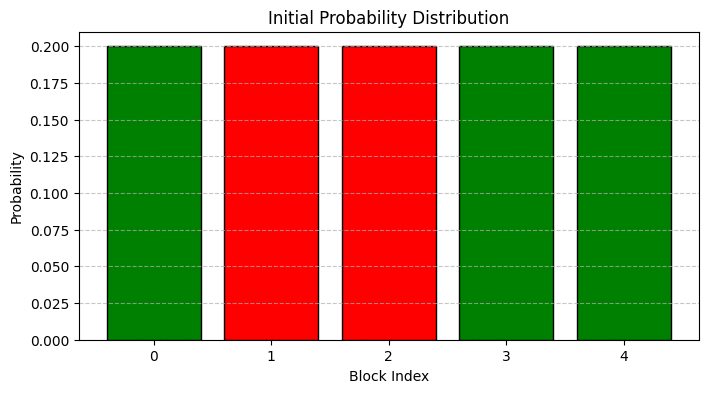


Sensed 'red':
Updated Probabilities (after sensing): [1.111e-01 3.333e-01 3.333e-01 1.111e-01 1.111e-01]


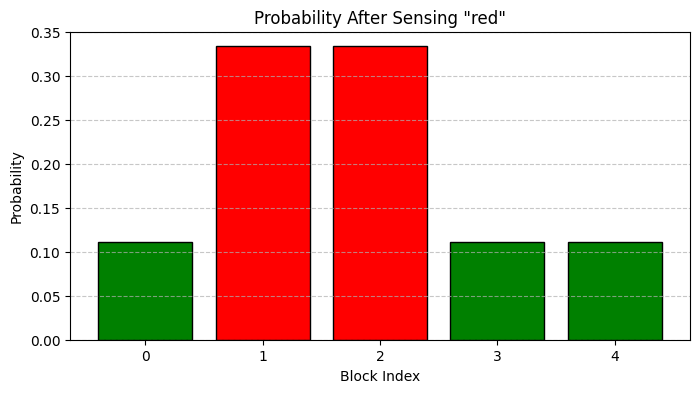


Moved 2 blocks to the right:
Updated Probabilities (after moving): [1.333e-01 1.111e-01 1.333e-01 3.111e-01 3.111e-01]


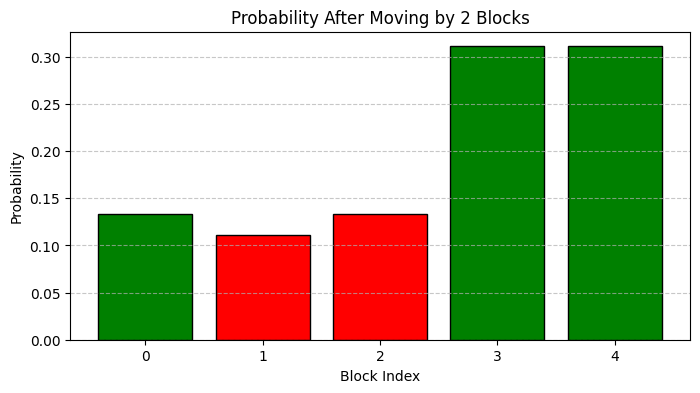


Sensed 'green':
Updated Probabilities (after sensing): [1.593e-01 4.425e-02 5.310e-02 3.717e-01 3.717e-01]


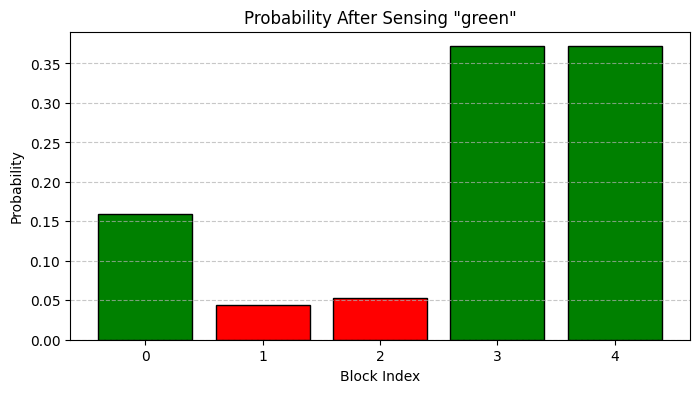


Moved 1 blocks to the left:
Updated Probabilities (after moving): [5.664e-02 8.407e-02 3.398e-01 3.504e-01 1.690e-01]


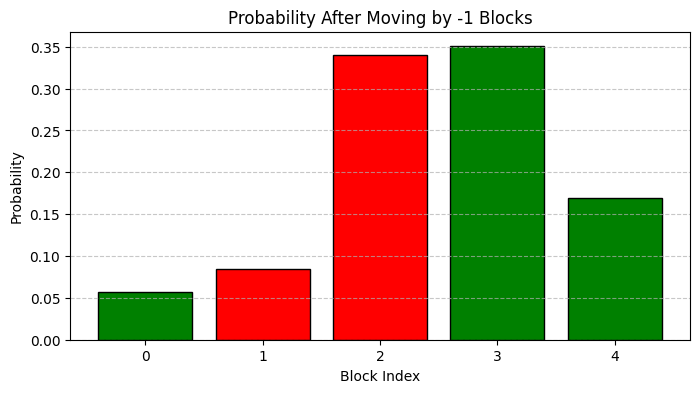


Final Probabilities: [5.664e-02 8.407e-02 3.398e-01 3.504e-01 1.690e-01]


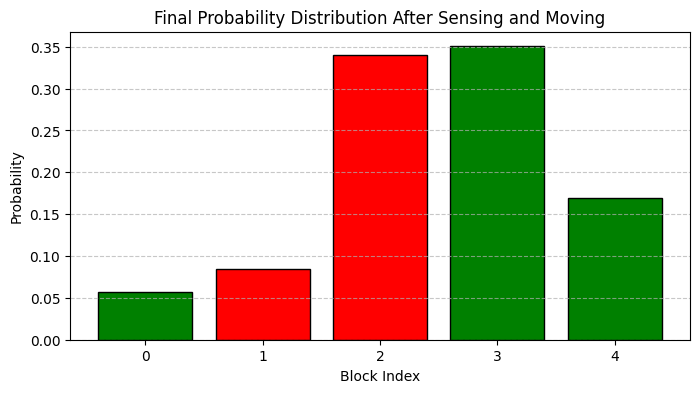

In [104]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import convolve1d

# ===============================
# Configurable Parameters
# ===============================
# Environment configuration
no_of_blocks = 5  # Number of blocks
world = ['green', 'red', 'red', 'green', 'green']  # Block colors
initial_probability = 1 / no_of_blocks  # Uniform probability

# Measurement parameters
pHit = 0.6  # Probability of correct measurement
pMiss = 0.2  # Probability of incorrect measurement

# Movement parameters
move_uncertainty = [0.1, 0.8, 0.1]  # Movement uncertainty kernel

# Sequence of robot actions
measurements = ['red', 'green']  # Sequence of sensed colors
movements = [2, -1]  # Movement: +2 blocks right, -1 block left

# ===============================
# Functions
# ===============================

def initialize_distribution(no_of_blocks, initial_probability):
    """
    Initialize a uniform probability distribution.
    """
    return [initial_probability] * no_of_blocks

def sense(p, z, world, pHit, pMiss):
    """
    Update probabilities based on sensor measurement.
    """
    q = []
    for i in range(len(world)):
        hit = (z == world[i])
        q.append(p[i] * (hit * pHit + (1 - hit) * pMiss))
    q = np.array(q) / sum(q)  # Normalize
    print(f"\nSensed '{z}':")
    print(f"Updated Probabilities (after sensing): {q}")
    return q

def move(p, U, move_uncertainty):
    """
    Shift probabilities by U steps (positive for right, negative for left) and add movement uncertainty.
    """
    q = np.roll(p, U)
    q = convolve1d(q, move_uncertainty, mode='wrap')  # Add uncertainty
    direction = "right" if U > 0 else "left"
    print(f"\nMoved {abs(U)} blocks to the {direction}:")
    print(f"Updated Probabilities (after moving): {q}")
    return q

def plot_distribution(p, world, title, xlabel='Block Index', ylabel='Probability'):
    """
    Plot the current probability distribution.
    """
    plt.figure(figsize=(8, 4))
    plt.bar(range(len(p)), p, color=['green' if block == 'green' else 'red' for block in world], edgecolor='black')
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(title)
    plt.xticks(range(len(p)))
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

# ===============================
# Main Execution
# ===============================

# Step 1: Initialize the probability distribution
p = initialize_distribution(no_of_blocks, initial_probability)
print(f"Initial Probabilities: {p}")
plot_distribution(p, world, "Initial Probability Distribution")

# Step 2: Process measurements and movements
for i in range(len(measurements)):
    # Sensing step
    p = sense(p, measurements[i], world, pHit, pMiss)
    plot_distribution(p, world, f'Probability After Sensing "{measurements[i]}"')

    # Movement step
    p = move(p, movements[i], move_uncertainty)
    plot_distribution(p, world, f'Probability After Moving by {movements[i]} Blocks')

# Final probabilities after all actions
print(f"\nFinal Probabilities: {p}")
plot_distribution(p, world, "Final Probability Distribution After Sensing and Moving")


## Histogram Filter - 2D

Initial Probabilities:
 [[5.000e-02 5.000e-02 5.000e-02 5.000e-02 5.000e-02]
 [5.000e-02 5.000e-02 5.000e-02 5.000e-02 5.000e-02]
 [5.000e-02 5.000e-02 5.000e-02 5.000e-02 5.000e-02]
 [5.000e-02 5.000e-02 5.000e-02 5.000e-02 5.000e-02]]


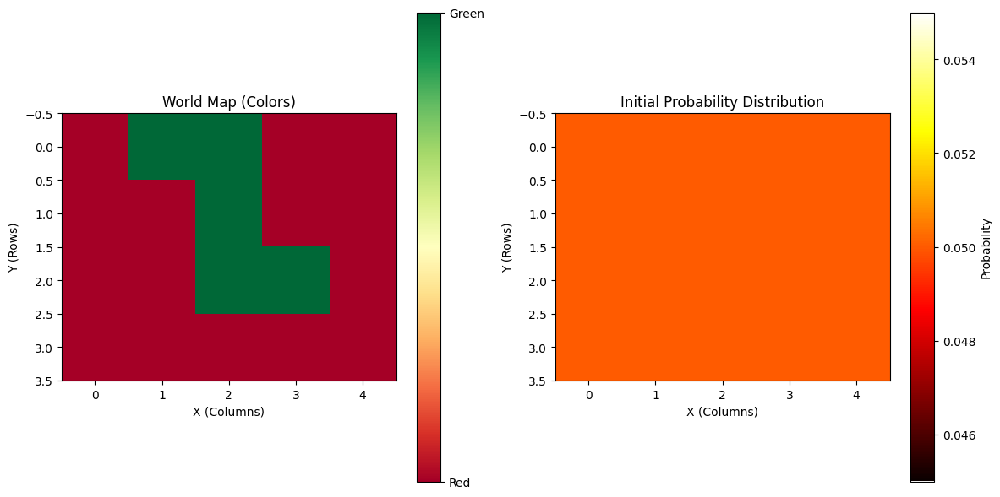


Sensed 'red':
Updated Probabilities (after sensing):
 [[6.000e-02 2.000e-02 2.000e-02 6.000e-02 6.000e-02]
 [6.000e-02 6.000e-02 2.000e-02 6.000e-02 6.000e-02]
 [6.000e-02 6.000e-02 2.000e-02 2.000e-02 6.000e-02]
 [6.000e-02 6.000e-02 6.000e-02 6.000e-02 6.000e-02]]


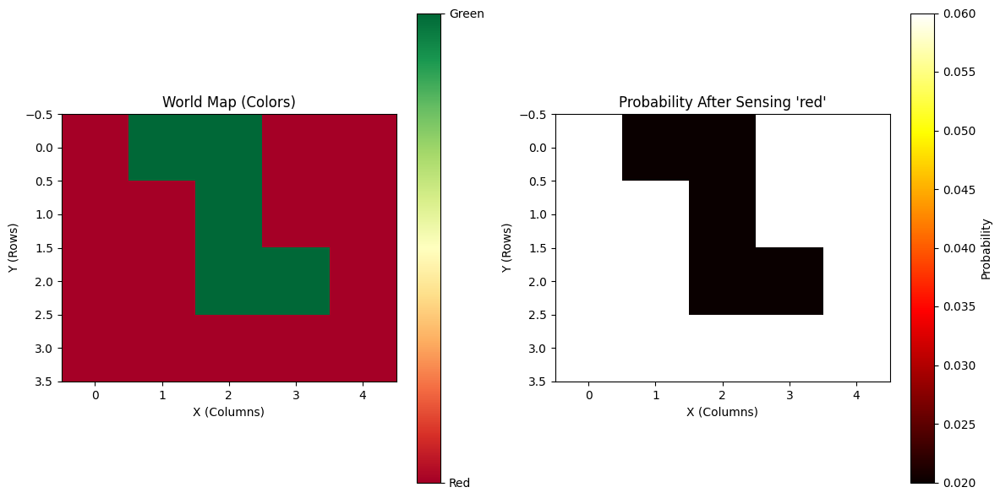


Moved up:
Updated Probabilities (after moving):
 [[5.800e-02 4.800e-02 3.200e-02 4.800e-02 5.800e-02]
 [6.000e-02 5.400e-02 3.600e-02 3.800e-02 5.600e-02]
 [5.800e-02 5.200e-02 4.800e-02 5.200e-02 5.800e-02]
 [5.600e-02 3.800e-02 3.600e-02 5.400e-02 6.000e-02]]


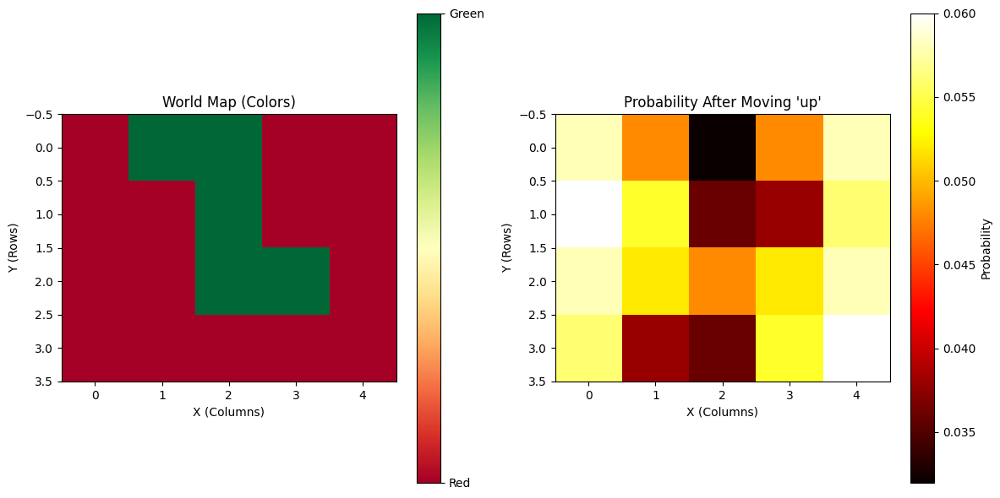


Sensed 'green':
Updated Probabilities (after sensing):
 [[4.050e-02 1.006e-01 6.704e-02 3.352e-02 4.050e-02]
 [4.190e-02 3.771e-02 7.542e-02 2.654e-02 3.911e-02]
 [4.050e-02 3.631e-02 1.006e-01 1.089e-01 4.050e-02]
 [3.911e-02 2.654e-02 2.514e-02 3.771e-02 4.190e-02]]


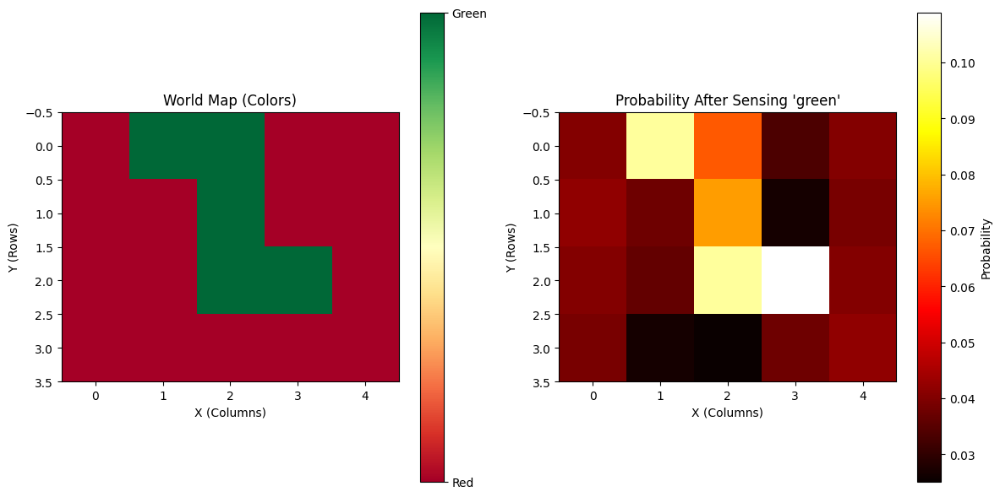


Moved up:
Updated Probabilities (after moving):
 [[4.344e-02 5.293e-02 6.732e-02 4.874e-02 4.176e-02]
 [3.925e-02 4.413e-02 7.123e-02 7.318e-02 4.651e-02]
 [4.148e-02 4.316e-02 4.721e-02 4.846e-02 4.372e-02]
 [4.567e-02 6.648e-02 5.670e-02 3.966e-02 3.897e-02]]


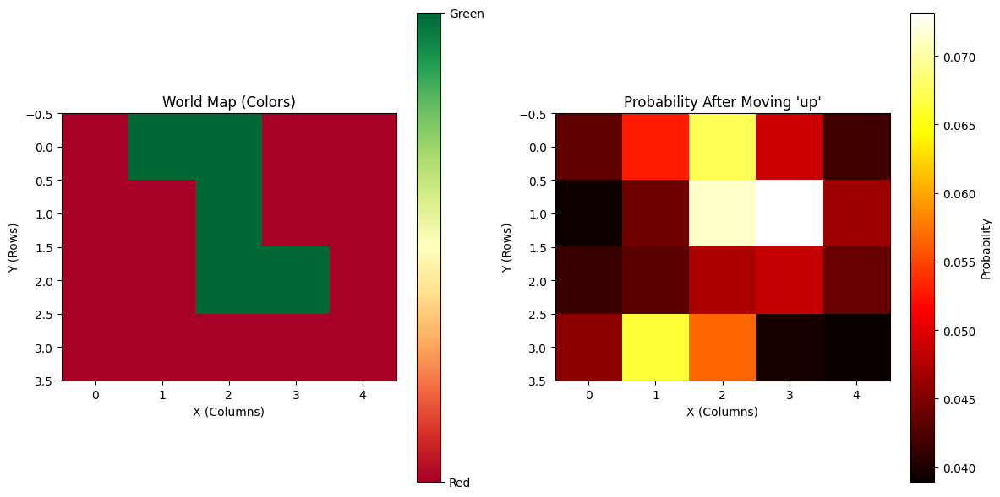


Sensed 'green':
Updated Probabilities (after sensing):
 [[2.759e-02 1.009e-01 1.283e-01 3.096e-02 2.653e-02]
 [2.493e-02 2.803e-02 1.357e-01 4.649e-02 2.954e-02]
 [2.635e-02 2.741e-02 8.996e-02 9.235e-02 2.777e-02]
 [2.901e-02 4.223e-02 3.602e-02 2.520e-02 2.475e-02]]


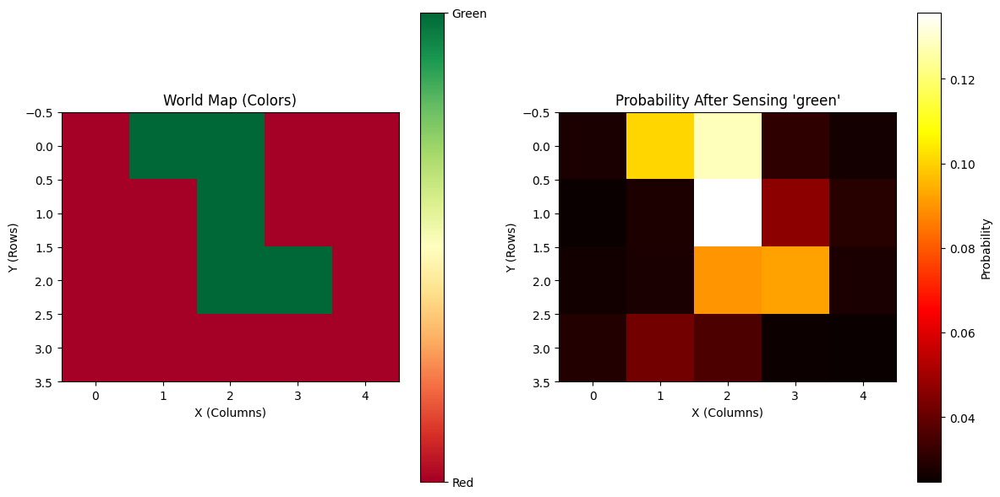


Moved up:
Updated Probabilities (after moving):
 [[3.025e-02 5.372e-02 9.615e-02 6.108e-02 3.325e-02]
 [2.768e-02 4.091e-02 7.223e-02 6.718e-02 3.469e-02]
 [3.282e-02 4.983e-02 5.555e-02 4.211e-02 2.961e-02]
 [3.540e-02 7.425e-02 8.877e-02 4.634e-02 2.818e-02]]


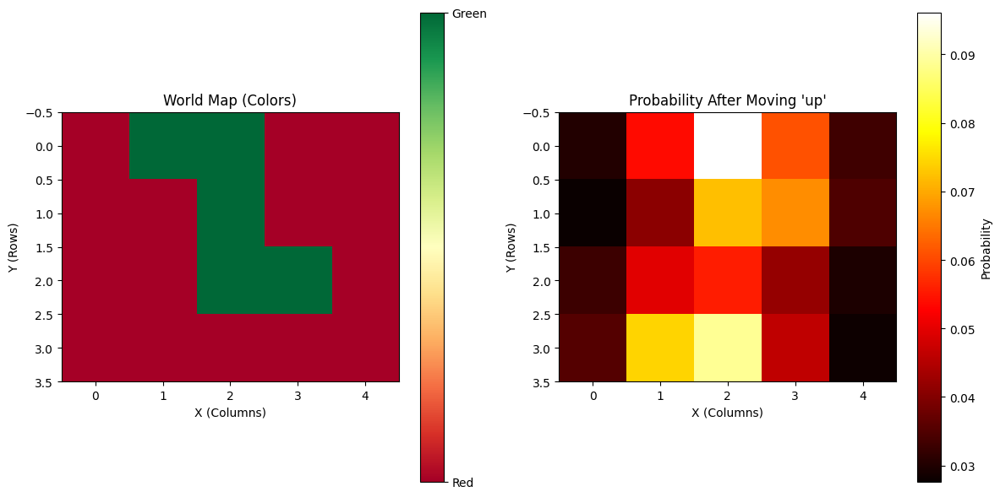


Sensed 'green':
Updated Probabilities (after sensing):
 [[1.845e-02 9.829e-02 1.759e-01 3.725e-02 2.028e-02]
 [1.688e-02 2.495e-02 1.322e-01 4.098e-02 2.116e-02]
 [2.002e-02 3.039e-02 1.017e-01 7.706e-02 1.806e-02]
 [2.159e-02 4.528e-02 5.414e-02 2.826e-02 1.719e-02]]


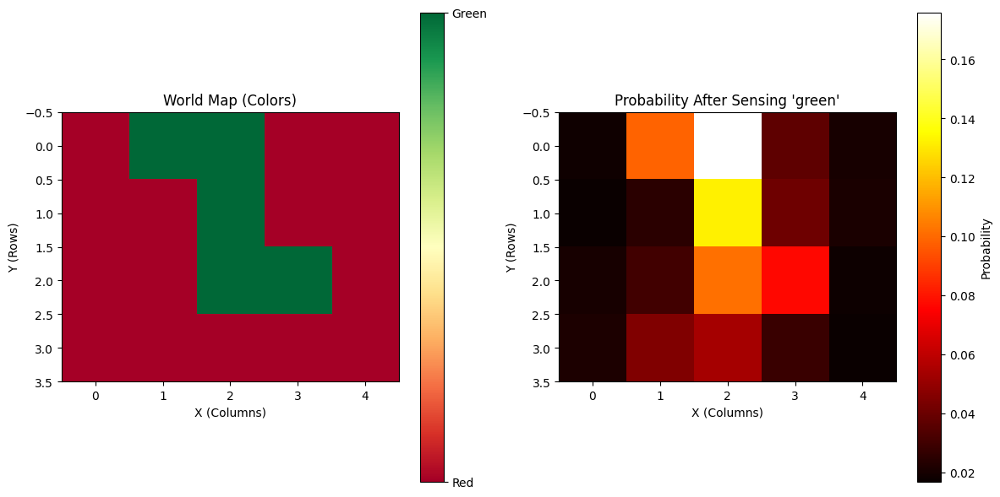


Moved left:
Updated Probabilities (after moving):
 [[7.702e-02 1.095e-01 5.268e-02 2.290e-02 2.851e-02]
 [5.356e-02 9.937e-02 5.895e-02 2.572e-02 2.356e-02]
 [4.259e-02 7.701e-02 6.095e-02 2.615e-02 2.213e-02]
 [5.436e-02 6.892e-02 4.567e-02 2.333e-02 2.708e-02]]


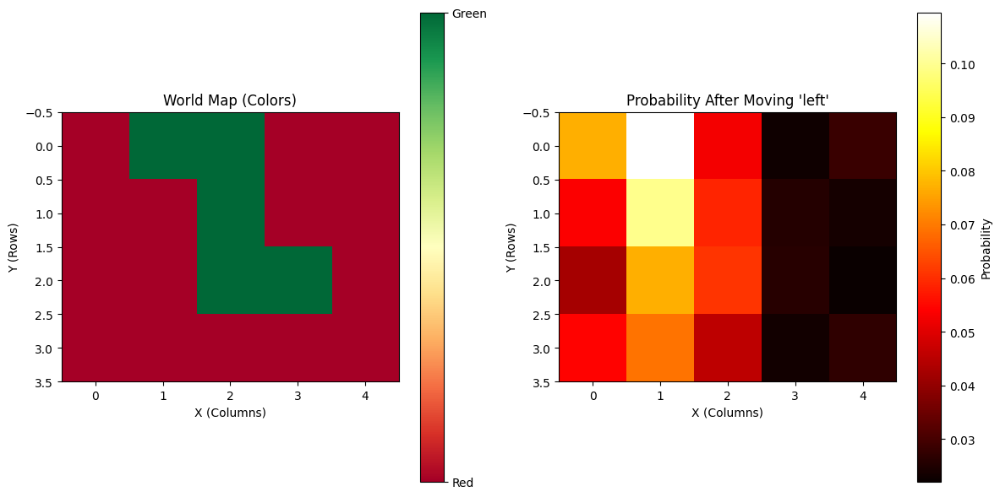


Final Probabilities:
 [[7.702e-02 1.095e-01 5.268e-02 2.290e-02 2.851e-02]
 [5.356e-02 9.937e-02 5.895e-02 2.572e-02 2.356e-02]
 [4.259e-02 7.701e-02 6.095e-02 2.615e-02 2.213e-02]
 [5.436e-02 6.892e-02 4.567e-02 2.333e-02 2.708e-02]]


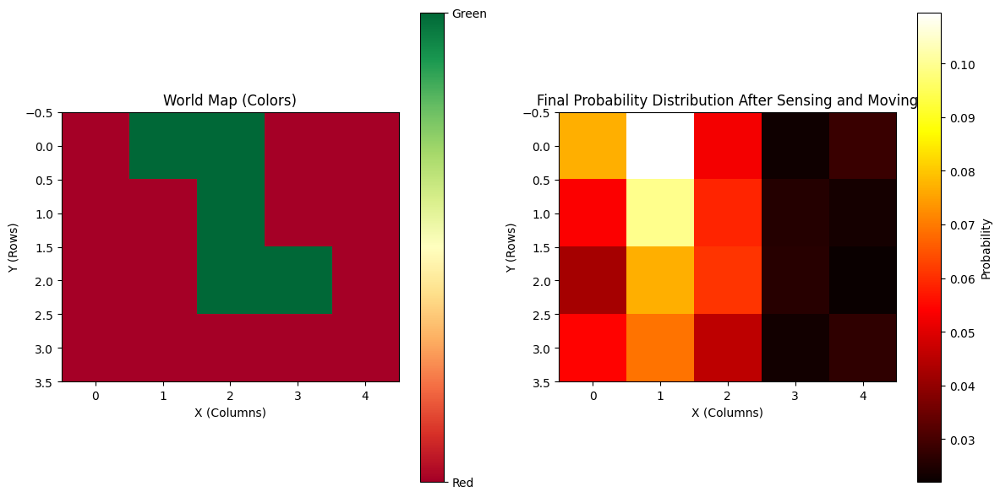

In [105]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import convolve2d

# ===============================
# Configurable Parameters
# ===============================
# Initial probabilities (4x5 grid)
prb = 1 / 20
p = np.array([[prb, prb, prb, prb, prb],
              [prb, prb, prb, prb, prb],
              [prb, prb, prb, prb, prb],
              [prb, prb, prb, prb, prb]])

# World map (4x5 grid of colors)
world = np.array([['red', 'green', 'green', 'red', 'red'],
                  ['red', 'red', 'green', 'red', 'red'],
                  ['red', 'red', 'green', 'green', 'red'],
                  ['red', 'red', 'red', 'red', 'red']])

# Measurements and movements
measurements = ['red', 'green', 'green', 'green']
movements = ['up', 'up', 'up', 'left']

# Measurement probabilities
pHit = 0.6
pMiss = 0.2

# Movement uncertainty (3x3 kernel)
move_uncertainty = np.array([[0.05, 0.1, 0.05],
                             [0.1, 0.4, 0.1],
                             [0.05, 0.1, 0.05]])

# ===============================
# Functions
# ===============================

def sense_2d(p, z, world, pHit, pMiss):
    """
    Update the 2D probability distribution based on the sensor reading.
    Args:
    - p: 2D numpy array of probabilities for each cell.
    - z: Measured color ('red' or 'green').
    - world: 2D numpy array representing the grid colors.
    - pHit: Probability of correct sensing.
    - pMiss: Probability of incorrect sensing.

    Returns:
    - Updated 2D probability distribution (numpy array).
    """
    hit = (world == z)
    q = p * (hit * pHit + (~hit) * pMiss)
    q /= q.sum()  # Normalize
    print(f"\nSensed '{z}':")
    print("Updated Probabilities (after sensing):\n", q)
    return q

def move_2d(p, direction, move_uncertainty):
    """
    Move the robot in 2D space with added movement uncertainty.
    Args:
    - p: 2D numpy array of probabilities for each cell.
    - direction: Direction to move ('up', 'down', 'left', 'right').
    - move_uncertainty: 2D numpy array defining the uncertainty distribution for movement.

    Returns:
    - Updated 2D probability distribution after movement with uncertainty (numpy array).
    """
    if direction == 'up':
        q = np.roll(p, -1, axis=0)
    elif direction == 'down':
        q = np.roll(p, 1, axis=0)
    elif direction == 'left':
        q = np.roll(p, -1, axis=1)
    elif direction == 'right':
        q = np.roll(p, 1, axis=1)
    else:
        raise ValueError(f"Invalid movement direction: {direction}")

    q = convolve2d(q, move_uncertainty, mode='same', boundary='wrap')  # Add uncertainty
    q /= q.sum()  # Normalize
    print(f"\nMoved {direction}:")
    print("Updated Probabilities (after moving):\n", q)
    return q

def plot_2d_world_and_probabilities(world, p, title):
    """
    Plot the 2D world map and the probability distribution side by side.
    Args:
    - world: 2D numpy array representing the world (colors like 'red' and 'green').
    - p: 2D numpy array of probabilities.
    - title: Title for the probability distribution plot.
    """
    # Convert world map to numeric values for visualization
    color_map = {'red': 0, 'green': 1}
    numeric_world = np.vectorize(color_map.get)(world)
    
    # Set up subplots
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    
    # World map visualization
    im1 = axes[0].imshow(numeric_world, cmap='RdYlGn', interpolation='nearest')
    axes[0].set_title('World Map (Colors)')
    axes[0].set_xlabel('X (Columns)')
    axes[0].set_ylabel('Y (Rows)')
    cbar1 = fig.colorbar(im1, ax=axes[0], ticks=[0, 1])
    cbar1.ax.set_yticklabels(['Red', 'Green'])
    
    # Probability distribution visualization
    im2 = axes[1].imshow(p, cmap='hot', interpolation='nearest')
    axes[1].set_title(title)
    axes[1].set_xlabel('X (Columns)')
    axes[1].set_ylabel('Y (Rows)')
    cbar2 = fig.colorbar(im2, ax=axes[1], label='Probability')
    
    plt.tight_layout()
    plt.show()

# ===============================
# Main Execution (Updated)
# ===============================

# Step 1: Initialize the probability distribution
print("Initial Probabilities:\n", p)
plot_2d_world_and_probabilities(world, p, "Initial Probability Distribution")

# Step 2: Process measurements and movements
for i in range(len(measurements)):
    # Sensing step
    p = sense_2d(p, measurements[i], world, pHit, pMiss)
    plot_2d_world_and_probabilities(world, p, f"Probability After Sensing '{measurements[i]}'")

    # Movement step
    p = move_2d(p, movements[i], move_uncertainty)
    plot_2d_world_and_probabilities(world, p, f"Probability After Moving '{movements[i]}'")

# Final probabilities after all actions
print("\nFinal Probabilities:\n", p)
plot_2d_world_and_probabilities(world, p, "Final Probability Distribution After Sensing and Moving")


# SVM

## SVM accuracy

In [106]:
from sklearn.model_selection import train_test_split
from sklearn import svm
from sklearn import metrics
import numpy as np

# Step 1: Load the Dataset
x = np.loadtxt(r'C:\Users\User\Documents\GitHub\pfas\helper_functions\ExamFiles2021\Exam Files\Question_29\svm_x.txt', dtype=float)
y = np.loadtxt(r'C:\Users\User\Documents\GitHub\pfas\helper_functions\ExamFiles2021\Exam Files\Question_29\svm_y.txt', dtype=int)

print("Dataset loaded successfully.")
print(f"Shape of X (features): {x.shape}")
print(f"Shape of y (labels): {y.shape}")

# Step 2: Split the Data into Training and Testing Sets
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=1337)

print("\nData split into training and testing sets.")
print(f"Number of training samples: {X_train.shape[0]}")
print(f"Number of testing samples: {X_test.shape[0]}")

# Step 3: Apply Support Vector Machine with Linear Kernel
clf = svm.SVC(kernel='linear')
clf.fit(X_train, y_train)

print("\nSVM model trained with a linear kernel.")

# Step 4: Make Predictions
y_pred = clf.predict(X_test)

# Step 5: Evaluate the Model
accuracy = metrics.accuracy_score(y_test, y_pred)

print("\nModel Evaluation:")
print("Predicted labels (y_pred):")
print(y_pred)
print("\nActual labels (y_test):")
print(y_test)
print(f"\nAccuracy: {accuracy:.4f}")


Dataset loaded successfully.
Shape of X (features): (569, 30)
Shape of y (labels): (569,)

Data split into training and testing sets.
Number of training samples: 398
Number of testing samples: 171

SVM model trained with a linear kernel.

Model Evaluation:
Predicted labels (y_pred):
[1 1 1 1 0 1 0 1 0 1 0 0 0 1 1 1 0 0 0 0 0 1 1 0 1 0 1 1 1 1 1 1 1 1 1 1 0
 1 0 1 1 1 0 0 1 0 1 1 1 0 0 0 0 1 1 0 1 0 1 1 1 1 0 0 1 0 0 1 0 0 1 1 0 1
 1 1 1 1 1 1 0 0 1 1 0 0 1 0 0 1 1 1 0 0 1 1 1 0 1 1 1 1 0 1 1 1 1 0 1 0 1
 1 1 1 1 1 0 1 1 0 0 1 1 0 1 1 1 0 1 0 1 1 0 1 0 0 1 1 1 0 1 0 1 1 0 1 0 1
 1 0 1 1 0 1 1 1 0 1 0 0 0 0 0 0 0 1 1 0 1 1 0]

Actual labels (y_test):
[1 1 1 1 0 1 0 1 0 1 0 0 0 0 1 1 0 0 0 0 0 1 1 0 1 0 1 1 1 1 1 1 1 1 1 1 0
 1 0 1 1 1 0 0 1 0 1 1 1 0 0 0 0 1 1 0 1 0 1 1 1 1 0 0 1 0 0 1 0 0 1 1 0 1
 1 1 1 1 1 1 0 1 1 1 0 0 1 0 0 1 1 1 0 0 1 1 1 0 1 1 1 1 0 1 1 1 1 0 1 0 1
 1 1 1 1 1 0 1 1 0 0 1 1 0 1 1 1 0 1 0 1 1 1 1 0 0 1 0 1 0 1 0 1 1 0 1 0 1
 1 0 1 1 0 1 1 0 0 1 0 1 0 1 0 0 0 1 1 0 1 

## SVM - Different Methods

Number of samples: 150
Number of features: 2

--- SVM with Linear Kernel ---
Training Accuracy: 0.80
Testing Accuracy: 0.80


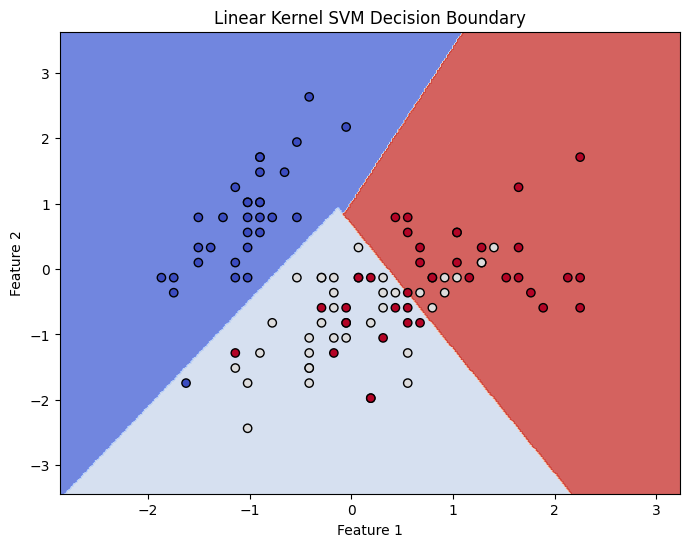


--- SVM with Rbf Kernel ---
Training Accuracy: 0.79
Testing Accuracy: 0.73


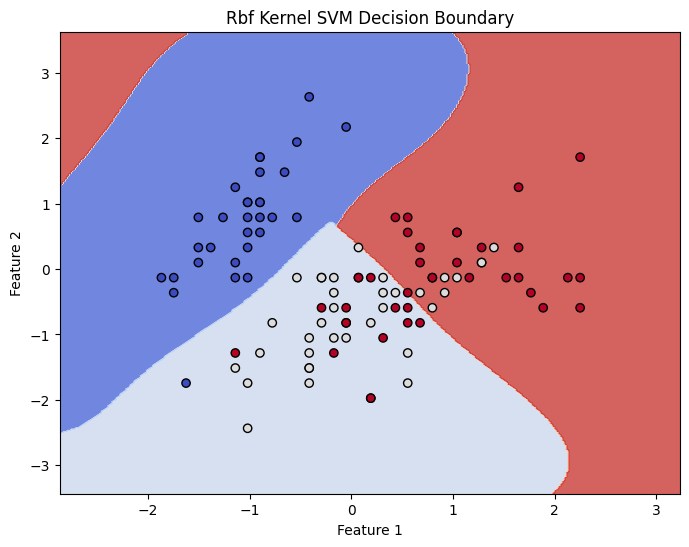


--- SVM with Poly Kernel ---
Training Accuracy: 0.75
Testing Accuracy: 0.76


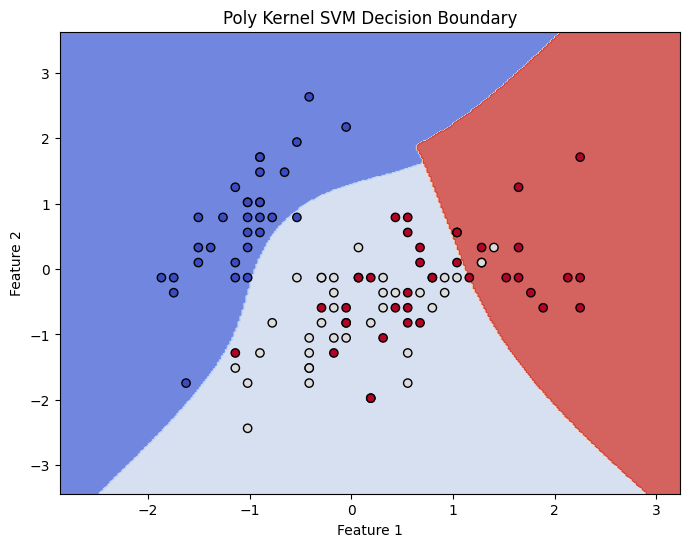


--- SVM with Sigmoid Kernel ---
Training Accuracy: 0.78
Testing Accuracy: 0.76


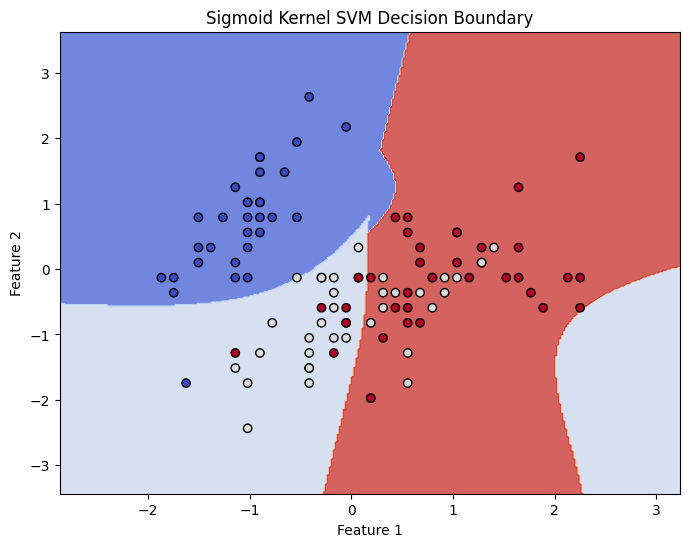

In [107]:
import sklearn as sk
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from matplotlib import pyplot as plt
import pandas as pd
import numpy as np

# Helper function for plotting the fit of your SVM
def plot_fit(X, y, clf, title="SVM Decision Boundary"):
    """
    X = samples
    y = Ground truth
    clf = trained model
    title = title for the plot
    """
    h = .02
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))
    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])

    # Put the result into a color plot
    Z = Z.reshape(xx.shape)
    plt.figure(figsize=(8, 6))
    plt.contourf(xx, yy, Z, cmap=plt.cm.coolwarm, alpha=0.8)

    # Plot also the training points
    plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.cm.coolwarm, edgecolors="black")
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.title(title)
    plt.show()

# Load Iris dataset
iris = sk.datasets.load_iris()
iris_df = pd.DataFrame(iris.data, columns=iris.feature_names)
X = iris_df.iloc[:, :2].values  # Only use the first two features
y = iris.target
print(f"Number of samples: {X.shape[0]}")
print(f"Number of features: {X.shape[1]}")

# Normalize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42)

# Test different kernels
kernels = ['linear', 'rbf', 'poly', 'sigmoid']
for kernel in kernels:
    print(f"\n--- SVM with {kernel.capitalize()} Kernel ---")
    
    # Only include `degree` if the kernel is 'poly'
    if kernel == 'poly':
        model = SVC(kernel=kernel, gamma='scale', C=1, degree=3)
    else:
        model = SVC(kernel=kernel, gamma='scale', C=1)

    model.fit(X_train, y_train)

    train_accuracy = model.score(X_train, y_train)
    test_accuracy = model.score(X_test, y_test)
    print(f"Training Accuracy: {train_accuracy:.2f}")
    print(f"Testing Accuracy: {test_accuracy:.2f}")

    # Plot decision boundary
    plot_fit(X_train, y_train, model, f"{kernel.capitalize()} Kernel SVM Decision Boundary")

# Note: Precomputed kernels require a specific kernel matrix, which would involve creating a custom kernel. 
# This is not included here as it requires additional setup and is use-case specific.
